<a href="https://colab.research.google.com/github/maleal2/Object-Detection-in-Autonomous-Driving-Using-BDD100K-Dataset/blob/main/Team09_FinalCode.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

- Name: Maria Carolina Leal Cardenas.
- Date: 12/07/2024

**Abstract:**

This paper presents the implementation and optimization of YOLOv8 for object detection using a custom dataset derived from BDD100K, one of the largest open driving datasets by Berkeley DeepDrive. The dataset includes training and validation subsets with annotations initially in JSON format. Early steps involved analyzing BDD100K’s structure, quantifying annotations, and addressing class imbalances by duplicating data for underrepresented categories like bicycles, motorcycles, trains, and trailers. Augmentation techniques, including horizontal flips, color jitter, random rotations, scaling, and cropping, were applied using the Albumentations library.
A rigorous cross-validation process ensured consistency between annotations and images, resulting in 25,303 training and 6,326 validation images. Annotations were converted into YOLO format while maintaining separate folders for the original and processed data. Challenges, such as invalid bounding boxes from augmentation, were resolved through validation and normalization to preserve data integrity.
Training began with YOLOv8 nano, using 50 epochs, 640-pixel images, and a batch size of 16. Metrics such as F1 scores, precision, recall curves, confusion matrices, and losses were analyzed. Fine-tuning with the YOLOv8 small model included additional data cleaning based on earlier errors, improving dataset reliability through validation and logging. A third training round adjusted hyperparameters, such as learning rate and image size, for further optimization.
Conducted on Google Colab with data stored on Google Drive, the project iteratively addressed challenges like bounding box errors and annotation mismatches. This study highlights best practices for YOLOv8 optimization in autonomous driving, emphasizing data management and model performance. Future work may explore advanced augmentation, regularization techniques, and incorporating weather conditions for a more robust dataset.


 # Installing the necessary libraries

In [ ]:
# Necessary libraries
!pip install -q pycocotools matplotlib opencv-python tqdm
!pip install -q torch torchvision torchaudio
!pip install -q bdd100k
!pip install -q albumentations

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.4/54.4 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 164.7/164.7 kB 13.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 161.5/161.5 kB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 10.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.2/139.2 kB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.2/13.2 MB 63.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.2/83.2 kB 7.1 MB/s eta 0:00:00


# Importing basic libraries

In [ ]:
import os
import json
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from pycocotools.coco import COCO

# BDD100K: A Large-scale Diverse Driving Video Database.

- The dataset of BDD100K from Bakerly University is available in the following URL: https://dl.cv.ethz.ch/bdd100k/data/.
- The info of the dataset is available at: https://doc.bdd100k.com/download.html#k-images
- The following articles are part of the reference for understanding the data used in this project: https://bair.berkeley.edu/blog/2018/05/30/bdd/ and https://doi.org/10.48550/arXiv.1805.04687

- URLs used in this project:

Validation set: https://dl.cv.ethz.ch/bdd100k/data/100k_images_val.zip , 10,000 files.

Testing set: https://dl.cv.ethz.ch/bdd100k/data/100k_images_test.zip, 20,000 files.

Training set: https://dl.cv.ethz.ch/bdd100k/data/100k_images_train.zip, 70,000 files.

Labels set: https://dl.cv.ethz.ch/bdd100k/data/bdd100k_det_20_labels_trainval.zip

# Verifying the Dataset structure

In [ ]:
# Defining the base path and subdirectories
base_path = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project'
images_path = os.path.join(base_path, 'images')
labels_path = os.path.join(base_path, 'labels')

# Verifying directories and files
print("Test Images Directory:", os.listdir(os.path.join(images_path, 'test'))[:5])
print("Train Images Directory:", os.listdir(os.path.join(images_path, 'train'))[:5])
print("Validation Images Directory:", os.listdir(os.path.join(images_path, 'val'))[:5])
print("Labels Directory:", os.listdir(labels_path))

Test Images Directory: ['e9aeea56-8566a955.jpg', 'e873345d-3db8d18a.jpg', 'f7e43a5f-f2f23ba0.jpg', 'd96d39ac-996c5f0b.jpg', 'fce4e596-e3f3668b.jpg']
Train Images Directory: ['2802e2c0-a010c04f.jpg', '302322ea-d6ddaf33.jpg', '9f99d91c-2cd1792b.jpg', '9ec0c96a-e4985eae.jpg', '7133ddf7-98cbc6fa.jpg']
Validation Images Directory: ['c80bb624-37b71a0f.jpg', 'fe189115-9cc4a501.jpg', 'c5e8ab3b-6e92761c.jpg', 'b4c62929-8d5e3448.jpg', 'c0c51509-cb8d3298.jpg']
Labels Directory: ['det_train.json', 'det_val.json', 'duplicated_annotations.json', 'augmented_annotations.json', 'merged_annotations.json']


# Loading and exploring annotations

In [ ]:
# Loading the training annotations
train_annotations_path = os.path.join(labels_path, 'det_train.json')
with open(train_annotations_path, 'r') as file:
    train_annotations = json.load(file)

# Printing a sample annotation
print("Sample Annotation:", json.dumps(train_annotations[0], indent=2))

Sample Annotation: {
  "name": "0000f77c-6257be58.jpg",
  "attributes": {
    "weather": "clear",
    "timeofday": "daytime",
    "scene": "city street"
  },
  "timestamp": 10000,
  "labels": [
    {
      "id": "0",
      "attributes": {
        "occluded": false,
        "truncated": false,
        "trafficLightColor": "G"
      },
      "category": "traffic light",
      "box2d": {
        "x1": 1125.902264,
        "y1": 133.184488,
        "x2": 1156.978645,
        "y2": 210.875445
      }
    },
    {
      "id": "1",
      "attributes": {
        "occluded": false,
        "truncated": false,
        "trafficLightColor": "G"
      },
      "category": "traffic light",
      "box2d": {
        "x1": 1156.978645,
        "y1": 136.637417,
        "x2": 1191.50796,
        "y2": 210.875443
      }
    },
    {
      "id": "2",
      "attributes": {
        "occluded": false,
        "truncated": false,
        "trafficLightColor": "NA"
      },
      "category": "traffic sign",
  

# Visualizing a sample image with bounding boxes

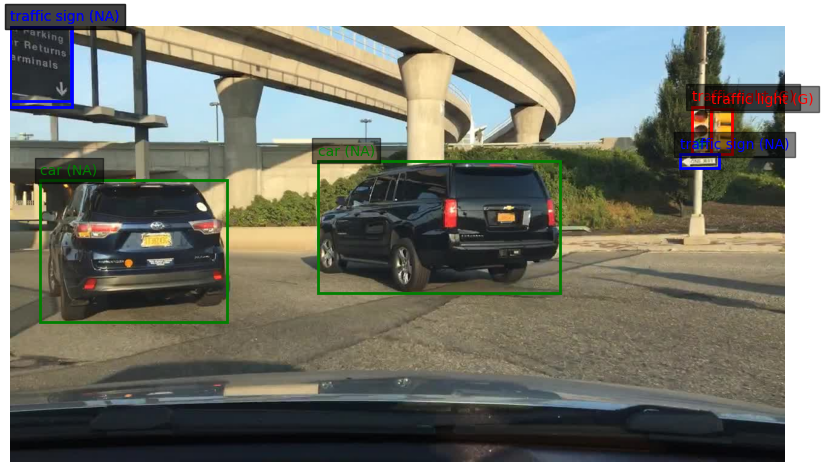

In [ ]:
# Function to plot image with bounding boxes and attributes
def plot_image_with_boxes(image_path, annotations):
    # Loading and converting the image to RGB
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Creating a color map for distinct categories
    category_colors = {
        "traffic light": "red",
        "traffic sign": "blue",
        "car": "green",
        "pedestrian": "yellow",
        "bicycle": "purple"
    }

    plt.figure(figsize=(10, 10))
    plt.imshow(image)

    # Iterating through annotations
    for ann in annotations:
        bbox = ann['box2d']
        x1, y1, x2, y2 = bbox['x1'], bbox['y1'], bbox['x2'], bbox['y2']
        category = ann['category']
        color = category_colors.get(category, "white")  # Default color is white

        # Drawing the bounding box
        plt.gca().add_patch(
            plt.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor=color, facecolor='none')
        )

        # Adding label with category and attributes
        label = f"{category}"
        if 'attributes' in ann and 'trafficLightColor' in ann['attributes']:
            label += f" ({ann['attributes']['trafficLightColor']})"
        plt.text(
            x1, y1 - 10, label, color=color, fontsize=10, bbox=dict(facecolor='black', alpha=0.5)
        )

    plt.axis('off')
    plt.show()

# Visualizing a sample image
image_name = "0000f77c-6257be58.jpg"  # Example image name from annotations
image_path = os.path.join(images_path, 'train', image_name)

# Extracting relevant annotations for the chosen image
annotations = [
    label for label in train_annotations if label['name'] == image_name
][0]['labels']  # Assuming 'labels' key contains all objects for an image

# Calling the plotting function
plot_image_with_boxes(image_path, annotations)

# Analyzing distribution of categories

This step will help in understanding which objects are most frequently labeled in the dataset.

In [ ]:
# Defining paths for training and validation annotations
train_annotations_path = os.path.join(labels_path, 'det_train.json')
val_annotations_path = os.path.join(labels_path, 'det_val.json')

# Loading JSON files
with open(train_annotations_path, 'r') as f:
    train_annotations = json.load(f)

with open(val_annotations_path, 'r') as f:
    val_annotations = json.load(f)

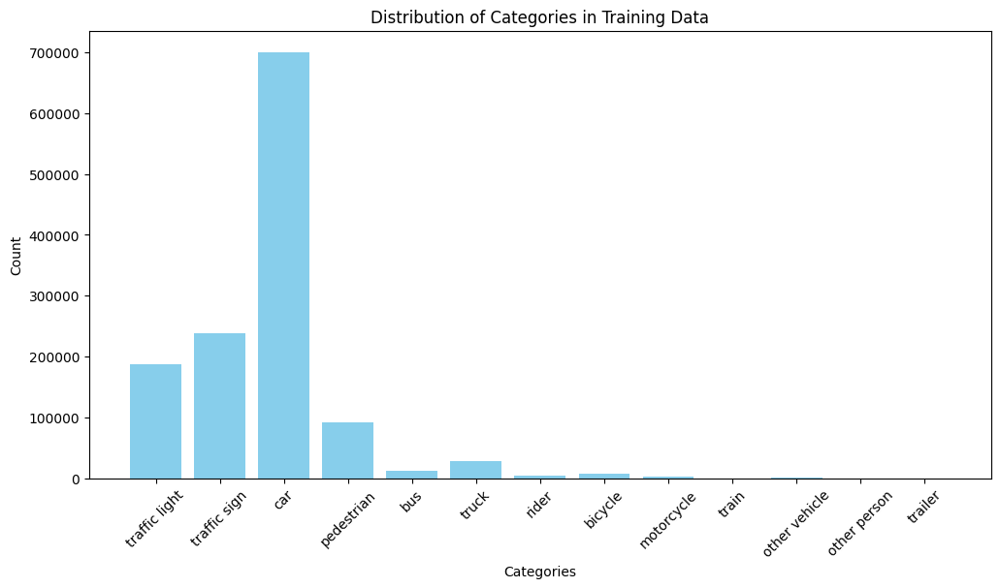

In [ ]:
from collections import Counter

# Counting occurrences of each category
category_counts = Counter()

# Looping through each image annotation
for annotation in train_annotations:
    if 'labels' in annotation:
        for label in annotation['labels']:
            category_counts[label['category']] += 1

# Plotting the distribution of categories
categories, counts = zip(*category_counts.items())
plt.figure(figsize=(12, 6))
plt.bar(categories, counts, color='skyblue')
plt.xlabel('Categories')
plt.ylabel('Count')
plt.title('Distribution of Categories in Training Data')
plt.xticks(rotation=45)
plt.show()


Key observations:

1. Imbalance in categories:

- Categories like "car" dominate the dataset, while others like "motorcycle", "bicycle", and "train" are underrepresented.
- This imbalance might bias the model toward detecting frequent categories more accurately while strugging with less frequent ones.

**Actions to consider:**

- Data augmentation: to apply techniques like flipping, cropping, and color jittering to increase the samples of underrepresented categories
- Weighted loss function: to use weight loss function during training to account for class imbalance.
- Sampling: to consider  onversampling the less frequest classes or undersampling the dominant class during training.

# Analyzing bounding boxes dimensions

This step is crucial to understand the distribution of object scales in terms of width, height, and aspect ratios.

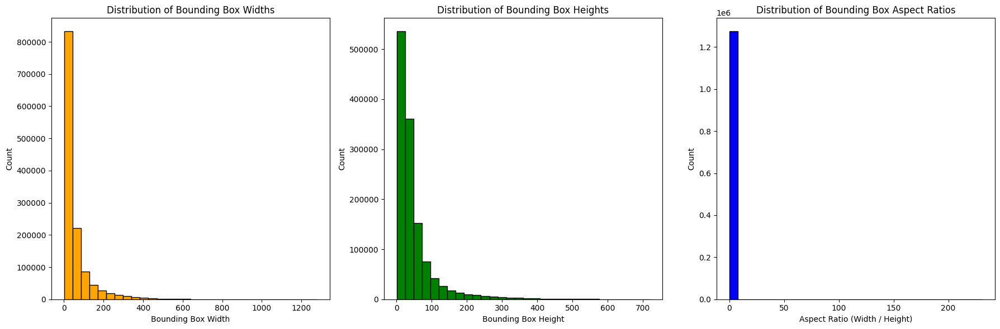

In [ ]:
# Collecting bounding box dimensions
bbox_widths = []
bbox_heights = []
aspect_ratios = []

for annotation in train_annotations:
    if 'labels' in annotation:
        for label in annotation['labels']:
            bbox = label['box2d']
            width = bbox['x2'] - bbox['x1']
            height = bbox['y2'] - bbox['y1']
            bbox_widths.append(width)
            bbox_heights.append(height)
            aspect_ratios.append(width / height)

# Plotting histograms for width, height, and aspect ratio
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.hist(bbox_widths, bins=30, color='orange', edgecolor='black')
plt.xlabel('Bounding Box Width')
plt.ylabel('Count')
plt.title('Distribution of Bounding Box Widths')

plt.subplot(1, 3, 2)
plt.hist(bbox_heights, bins=30, color='green', edgecolor='black')
plt.xlabel('Bounding Box Height')
plt.ylabel('Count')
plt.title('Distribution of Bounding Box Heights')

plt.subplot(1, 3, 3)
plt.hist(aspect_ratios, bins=30, color='blue', edgecolor='black')
plt.xlabel('Aspect Ratio (Width / Height)')
plt.ylabel('Count')
plt.title('Distribution of Bounding Box Aspect Ratios')

plt.tight_layout()
plt.show()

**Observations on the bounding box dimensions**:

1. Bounding box widths:

- The majority of bounding boxes have a width under 200 pixels, with a sharp drop for larger widths.
- Small objects detection, such as: traffic lights and signs, may be critical due to the prevalance of smaller widths.

2. Bounding box heights:

- Similar to widths, most bounding boxes have heights under 100 pixels.
- Objects in the dataset are generally more gorizontal than vertical.

3. Aspect ratios:

- Most bounding boxes have aspect ratio close to 1, like square-like objects.
- Some outliers with very large aspect ratios indicate either enlongated or incorrectly annotated objects.

**Actions to consider**:

- To normalize bounding box sizes during pre-processing to ensure uniform input for the model.
- To use anchor boxes for varying scales and aspect ratios during training to handle diversity in object shapes and sizes.

# Analyzing attribute distributions

In this step, it will be epxlored the distribution of attributes such as weather. time of the day, and scene.

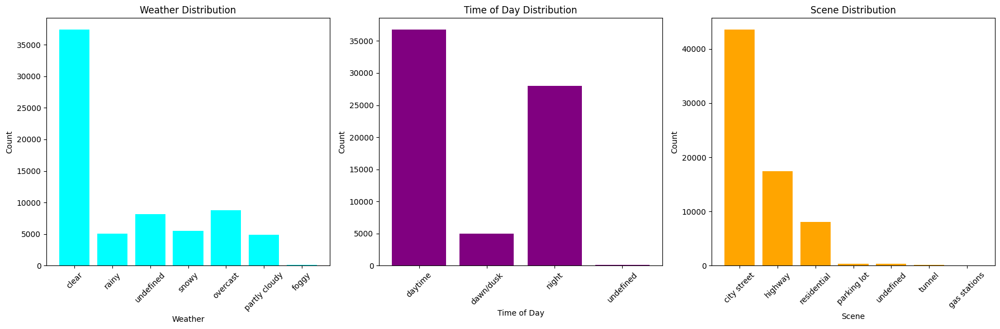

In [ ]:
# Counting occurrences of weather, timeofday, and scene attributes
weather_counts = Counter()
timeofday_counts = Counter()
scene_counts = Counter()

for annotation in train_annotations:
    attributes = annotation.get('attributes', {})
    weather_counts[attributes.get('weather', 'undefined')] += 1
    timeofday_counts[attributes.get('timeofday', 'undefined')] += 1
    scene_counts[attributes.get('scene', 'undefined')] += 1

# Plotting the distributions
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Weather distribution
axes[0].bar(weather_counts.keys(), weather_counts.values(), color='cyan')
axes[0].set_title('Weather Distribution')
axes[0].set_xlabel('Weather')
axes[0].set_ylabel('Count')
axes[0].tick_params(axis='x', rotation=45)

# Time of day distribution
axes[1].bar(timeofday_counts.keys(), timeofday_counts.values(), color='purple')
axes[1].set_title('Time of Day Distribution')
axes[1].set_xlabel('Time of Day')
axes[1].set_ylabel('Count')
axes[1].tick_params(axis='x', rotation=45)

# Scene distribution
axes[2].bar(scene_counts.keys(), scene_counts.values(), color='orange')
axes[2].set_title('Scene Distribution')
axes[2].set_xlabel('Scene')
axes[2].set_ylabel('Count')
axes[2].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


**Observations on attribute distributions**:

**Time of day**:

- Daytime and night images dominate, with very few dawn/dusk scenes.
- Models trained primarily on daytime and night images may struggle with transitions like dawn or dusk.

**Actions to consider**:

- Augment images to mimic dawn/dusk lighting conditions using filters or transformations to balance the dataset.

**Scenes**:

- City streets dominate the dataset, followed by highways and residential areas.
- Parking lots, tunnels, and gas stations are significantly unrrepresented.

**Actions to consider**:

- Scene-specific data augmentation or oversampling for underrepresented scenes to improve model generalization.



# Counting and Duplicating Unrrepresented Data

In [ ]:
import shutil

# Defining paths
base_path = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project'
images_path = os.path.join(base_path, 'images', 'train')
labels_path = os.path.join(base_path, 'labels')
duplicated_images_path = os.path.join(base_path, 'duplicated_images')
duplicated_annotations_path = os.path.join(labels_path, 'duplicated_annotations.json')
os.makedirs(duplicated_images_path, exist_ok=True)

# Loading annotations
train_annotations_path = os.path.join(labels_path, 'det_train.json')
with open(train_annotations_path, 'r') as f:
    train_annotations = json.load(f)

# Defining minority classes
minority_classes = ["bicycle", "motorcycle", "train", "trailer"]

# Identifying and count minority class images
minority_class_images = {cls: [] for cls in minority_classes}
for annotation in train_annotations:
    for label in annotation.get('labels', []):
        if label['category'] in minority_classes:
            minority_class_images[label['category']].append(annotation)

# Finding max class count for balancing
max_class_count = max(len(annotations) for annotations in minority_class_images.values())

# Duplicating images and annotations
duplicated_annotations = []
for category, annotations in minority_class_images.items():
    duplicates_needed = max_class_count - len(annotations)
    full_duplicates = annotations * (duplicates_needed // len(annotations))
    partial_duplicates = annotations[:duplicates_needed % len(annotations)]
    all_duplicates = full_duplicates + partial_duplicates

    for annotation in all_duplicates:
        # Duplicating image
        image_name = annotation['name']
        src_path = os.path.join(images_path, image_name)
        dst_path = os.path.join(duplicated_images_path, f"copy_{image_name}")
        shutil.copy(src_path, dst_path)

        # Duplicating annotation
        duplicated_annotation = annotation.copy()
        duplicated_annotation['name'] = f"copy_{image_name}"
        duplicated_annotations.append(duplicated_annotation)

# Saving duplicated annotations
with open(duplicated_annotations_path, 'w') as f:
    json.dump(duplicated_annotations, f)

print(f"Duplicated images saved to {duplicated_images_path}. Total: {len(duplicated_annotations)}")
print(f"Duplicated annotations saved to {duplicated_annotations_path}.")


Duplicated images saved to /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/duplicated_images. Total: 18150
Duplicated annotations saved to /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/labels/duplicated_annotations.json.


## Verification of duplicate data

Total duplicated images: 2493
Total duplicated annotations: 18150
All annotations have corresponding images!


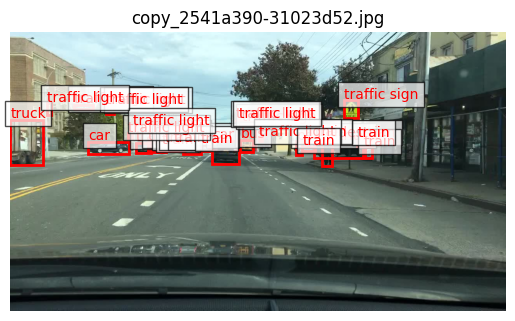

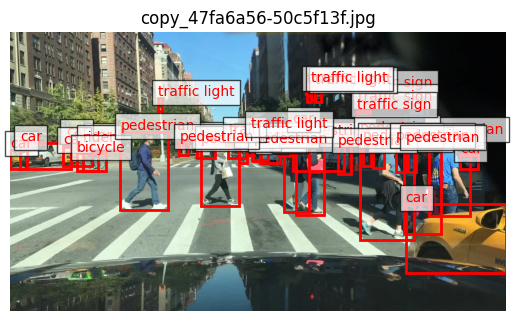

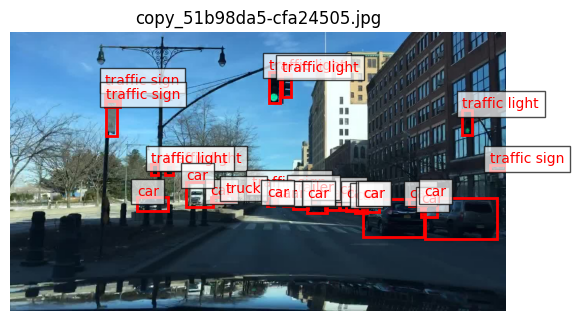

In [ ]:
import random

# Paths for duplicates
duplicated_images_path = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/duplicated_images'
duplicated_annotations_path = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/labels/duplicated_annotations.json'

# Loading annotations
with open(duplicated_annotations_path, 'r') as f:
    duplicated_annotations = json.load(f)

# Checking the total number of images and annotations
duplicated_images = os.listdir(duplicated_images_path)
print(f"Total duplicated images: {len(duplicated_images)}")
print(f"Total duplicated annotations: {len(duplicated_annotations)}")

# Verifying that all annotations correspond to an image
missing_images = [
    ann['name'] for ann in duplicated_annotations if ann['name'] not in duplicated_images
]
if missing_images:
    print(f"Missing images for the following annotations: {missing_images}")
else:
    print("All annotations have corresponding images!")

# Randomly visualizing a few duplicate images with their annotations
def visualize_random_duplicate():
    random_annotation = random.choice(duplicated_annotations)
    image_name = random_annotation['name']
    image_path = os.path.join(duplicated_images_path, image_name)

    if not os.path.exists(image_path):
        print(f"Image {image_name} not found!")
        return

    # Loading and plot the image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)

    # Plotting bounding boxes and labels
    for label in random_annotation['labels']:
        bbox = label['box2d']
        category = label['category']
        x1, y1, x2, y2 = bbox['x1'], bbox['y1'], bbox['x2'], bbox['y2']
        plt.gca().add_patch(
            plt.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='red', facecolor='none')
        )
        plt.text(x1, y1 - 5, category, color='red', fontsize=10, bbox=dict(facecolor='white', alpha=0.7))

    plt.title(image_name)
    plt.axis('off')
    plt.show()

# Visualizing a few random images
for _ in range(3):  # Visualize 3 random duplicates
    visualize_random_duplicate()


# Building a data augmentation pipeline for minority class

To address the imbalance effectively, I will focus on applyingn augmentations to the images and bounding boxes of underrepresented classes (e.g., "bicycle", "motorcycle", etc.). I will use the Albumentations library for augmentations since it supports bounding box transformations and integrates well with Pytorch and Tensorflow.

## Defining augmentation pipeline

- **Horizontal flip**: adds variation in object orientation.
- **Color jitter**: adjusts brightness, contrast, saturation, or hue.
- **Random rotate**: adds variability in object angles.
- **Random scale**: resizes objects to simulate changes in distance.
- **Random scrop**: simulates  partial visibility of objects.

In [ ]:
!pip install -U albumentations # Upgrading Albumentations version.

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.0/66.0 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.9/227.9 kB 9.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 632.7/632.7 kB 24.9 MB/s eta 0:00:00
  Attempting uninstall: albucore
    Found existing installation: albucore 0.0.19
    Uninstalling albucore-0.0.19:
      Successfully uninstalled albucore-0.0.19
  Attempting uninstall: albumentations
    Found existing installation: albumentations 1.4.20
    Uninstalling albumentations-1.4.20:
      Successfully uninstalled albumentations-1.4.20


In [ ]:
# Defining paths to manually ensure that "augmented_images" directory exists.
base_path = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project'
output_images_path = os.path.join(base_path, 'augmented_images')
os.makedirs(output_images_path, exist_ok=True)
print(f"Manually ensured directory exists: {output_images_path}")


Manually ensured directory exists: /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/augmented_images


## Augmentation of Original Data

In [ ]:
# Defining paths
base_path = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project'
images_path = os.path.join(base_path, 'images', 'train')
labels_path = os.path.join(base_path, 'labels')
output_images_path = os.path.join(base_path, 'augmented_images')
output_annotations_path = os.path.join(labels_path, 'augmented_annotations.json')

# Creating output directories
if not os.path.exists(output_images_path):
    os.makedirs(output_images_path, exist_ok=True)
    print(f"Directory created during loop execution: {output_images_path}")


# Loading training annotations
train_annotations_path = os.path.join(labels_path, 'det_train.json')
with open(train_annotations_path, 'r') as f:
    train_annotations = json.load(f)

print(f"Total annotations loaded: {len(train_annotations)}")

# Initializing augmented data list
augmented_annotations = []

# Defining minority classes
minority_classes = ["bicycle", "motorcycle", "train", "trailer"]

# Counting images with bounding boxes for minority classes
class_counts = {cls: 0 for cls in minority_classes}
for annotation in train_annotations:
    for label in annotation.get('labels', []):
        if label['category'] in minority_classes:
            class_counts[label['category']] += 1

print(f"Bounding box counts for minority classes:")
print(class_counts)

# Augmentation pipeline
augmentation_pipeline = Compose(
    [
        HorizontalFlip(p=0.5),
        RandomBrightnessContrast(p=0.2),
        RandomScale(scale_limit=0.2, p=0.3),
        Rotate(limit=15, p=0.3),
        RandomCrop(height=512, width=512, p=0.4),
        GaussNoise(p=0.2),
        MotionBlur(p=0.2),
        ToTensorV2(),
    ],
    bbox_params=BboxParams(format="coco", label_fields=["category_ids"], min_visibility=0.3)
)

# Helper functions for bounding box normalization/denormalization
def normalize_bboxes(bboxes, image_width, image_height):
    return [[bbox[0] / image_width, bbox[1] / image_height, bbox[2] / image_width, bbox[3] / image_height] for bbox in bboxes]

def denormalize_bboxes(bboxes, image_width, image_height):
    return [
        [
            max(0, min(bbox[0] * image_width, image_width)),  # Clamp values
            max(0, min(bbox[1] * image_height, image_height)),
            max(0, min(bbox[2] * image_width, image_width)),
            max(0, min(bbox[3] * image_height, image_height))
        ]
        for bbox in bboxes
    ]

def augment_image(image, bboxes, category_ids):
    height, width = image.shape[:2]
    normalized_bboxes = normalize_bboxes(bboxes, width, height)
    augmented = augmentation_pipeline(image=image, bboxes=normalized_bboxes, category_ids=category_ids)
    augmented_bboxes = denormalize_bboxes(augmented['bboxes'], width, height)
    return augmented['image'], augmented_bboxes, augmented['category_ids']

# Generating augmented data
start_time = time.time()
processed_images = 0

for annotation in train_annotations:
    image_name = annotation['name']
    image_path = os.path.join(images_path, image_name)

    # Loading the image
    if not os.path.exists(image_path):
        continue
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Filtering bounding boxes for minority classes
    bboxes = [
        [label['box2d']['x1'], label['box2d']['y1'], label['box2d']['x2'], label['box2d']['y2']]
        for label in annotation.get('labels', []) if label['category'] in minority_classes
    ]
    category_ids = [label['category'] for label in annotation.get('labels', []) if label['category'] in minority_classes]

    if not bboxes:
        continue

    # Applying augmentations
    for i in range(5):  # Generating 5 augmented samples per image
        augmented_image, augmented_bboxes, augmented_categories = augment_image(image, bboxes, category_ids)

        # Saving augmented image
        augmented_image_name = f"aug_{i}_{image_name}"
        augmented_image_path = os.path.join(output_images_path, augmented_image_name)
        augmented_image = augmented_image.permute(1, 2, 0).cpu().numpy()  # Converting to NumPy array
        augmented_image = cv2.cvtColor(augmented_image, cv2.COLOR_RGB2BGR)
        cv2.imwrite(augmented_image_path, augmented_image)

        # Saving augmented annotations (skip if no bounding boxes are valid)
        if augmented_bboxes:
            augmented_annotations.append({
                "name": augmented_image_name,
                "labels": [
                    {
                        "category": augmented_categories[j],
                        "box2d": {
                            "x1": bbox[0],
                            "y1": bbox[1],
                            "x2": bbox[2],
                            "y2": bbox[3]
                        }
                    }
                    for j, bbox in enumerate(augmented_bboxes)
                ]
            })
        else:
            print(f"Skipped annotation for {augmented_image_name} due to empty bounding boxes.")

    processed_images += 1
    if processed_images % 100 == 0:
        print(f"Processed {processed_images}/{len(train_annotations)} images...")

# Saving augmented annotations to file
with open(output_annotations_path, 'w') as f:
    json.dump(augmented_annotations, f)

end_time = time.time()
print(f"Augmented images saved to {output_images_path}")
print(f"Augmented annotations saved to {output_annotations_path}")
print(f"Total time taken: {end_time - start_time:.2f} seconds")


Streaming output truncated to the last 5000 lines.
Skipped annotation for aug_1_839f5adf-7248bdc3.jpg due to empty bounding boxes.
Skipped annotation for aug_4_839f5adf-7248bdc3.jpg due to empty bounding boxes.
Skipped annotation for aug_0_83a56dd8-49db87c6.jpg due to empty bounding boxes.
Skipped annotation for aug_1_83a56dd8-49db87c6.jpg due to empty bounding boxes.
Skipped annotation for aug_2_83a56dd8-49db87c6.jpg due to empty bounding boxes.
Skipped annotation for aug_4_83a56dd8-49db87c6.jpg due to empty bounding boxes.
Skipped annotation for aug_0_83acd378-27eae43e.jpg due to empty bounding boxes.
Skipped annotation for aug_1_83acd378-27eae43e.jpg due to empty bounding boxes.
Skipped annotation for aug_2_83acd378-27eae43e.jpg due to empty bounding boxes.
Skipped annotation for aug_3_83acd378-27eae43e.jpg due to empty bounding boxes.
Skipped annotation for aug_4_83acd378-27eae43e.jpg due to empty bounding boxes.
Skipped annotation for aug_1_83b71117-eb62db4e.jpg due to empty bound

## Check of augmented Images Directory

In [ ]:
# Path to augmented images
augmented_images_path = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/augmented_images'

# Listing the first 10 images in the directory
augmented_images = os.listdir(augmented_images_path)
print(f"Total augmented images: {len(augmented_images)}")
print(f"Sample augmented images: {augmented_images[:10]}")


Total augmented images: 32325
Sample augmented images: ['aug_0_ad51b83d-7ccbe7a2.jpg', 'aug_1_ad51b83d-7ccbe7a2.jpg', 'aug_2_ad51b83d-7ccbe7a2.jpg', 'aug_3_ad51b83d-7ccbe7a2.jpg', 'aug_4_ad51b83d-7ccbe7a2.jpg', 'aug_0_ad51e99f-44827ddd.jpg', 'aug_1_ad51e99f-44827ddd.jpg', 'aug_2_ad51e99f-44827ddd.jpg', 'aug_3_ad51e99f-44827ddd.jpg', 'aug_4_ad51e99f-44827ddd.jpg']


## Check of augmented Annotations File

In [ ]:
# Path to augmented annotations
augmented_annotations_path = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/labels/augmented_annotations.json'

# Loading and inspect the annotations
with open(augmented_annotations_path, 'r') as f:
    augmented_annotations = json.load(f)

print(f"Total augmented annotations: {len(augmented_annotations)}")
print(f"Sample annotation: {augmented_annotations[0]}")


Total augmented annotations: 13479
Sample annotation: {'name': 'aug_3_000f8d37-d4c09a0f.jpg', 'labels': [{'category': 'bicycle', 'box2d': {'x1': 739.3565368652344, 'y1': 351.3372588157654, 'x2': 761.2940979003906, 'y2': 388.4622287750244}}]}


## Cross-Verify Images and Annotations

In [ ]:
# Cross-checking images and annotations
missing_images = [
    annotation['name'] for annotation in augmented_annotations
    if annotation['name'] not in augmented_images
]

if missing_images:
    print(f"Missing images for {len(missing_images)} annotations.")
else:
    print("All annotations have corresponding images!")


All annotations have corresponding images!


## Random Visualization of Augmented Data

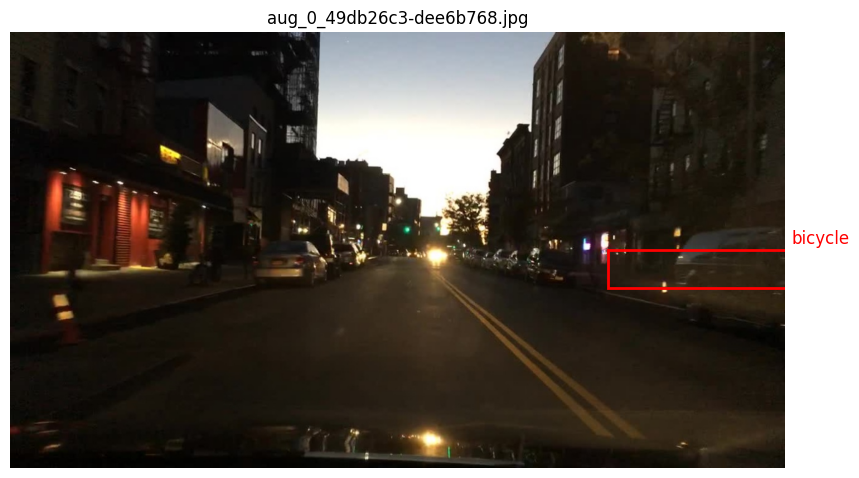

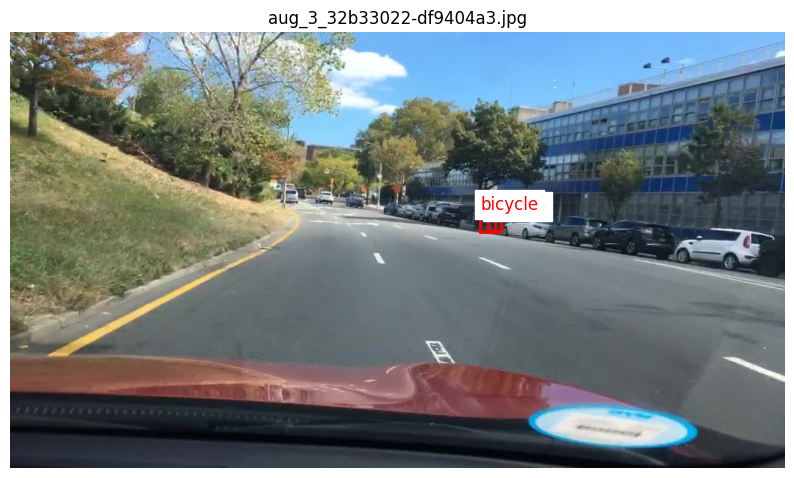

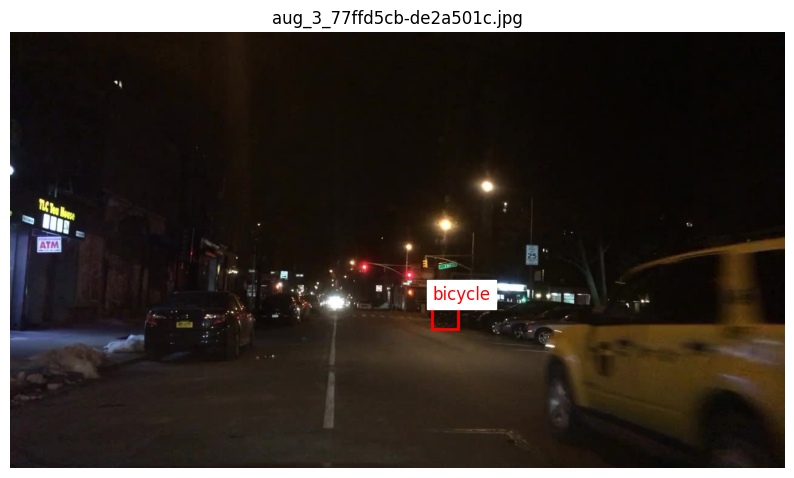

In [ ]:
import random

# Randomly selecting a few augmented annotations to visualize
random_annotations = random.sample(augmented_annotations, 3)

for annotation in random_annotations:
    image_path = os.path.join(augmented_images_path, annotation['name'])
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(10, 10))
    plt.imshow(image)

    # Drawing bounding boxes
    for label in annotation['labels']:
        bbox = label['box2d']
        plt.gca().add_patch(
            plt.Rectangle(
                (bbox['x1'], bbox['y1']),
                bbox['x2'] - bbox['x1'],
                bbox['y2'] - bbox['y1'],
                edgecolor='red',
                facecolor='none',
                linewidth=2
            )
        )
        plt.text(
            bbox['x1'], bbox['y1'] - 10, label['category'],
            color='red', fontsize=12, backgroundcolor="white"
        )

    plt.title(annotation['name'])
    plt.axis('off')
    plt.show()


# Merge of duplicated and Augmented data

In [ ]:
import shutil

# Defining paths
base_path = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project'
duplicated_images_path = os.path.join(base_path, 'duplicated_images')
augmented_images_path = os.path.join(base_path, 'augmented_images')
merged_images_path = os.path.join(base_path, 'merged_images')
os.makedirs(merged_images_path, exist_ok=True)

duplicated_annotations_path = os.path.join(base_path, 'labels/duplicated_annotations.json')
augmented_annotations_path = os.path.join(base_path, 'labels/augmented_annotations.json')
merged_annotations_path = os.path.join(base_path, 'labels/merged_annotations.json')

# Loading annotations
with open(duplicated_annotations_path, 'r') as f:
    duplicated_annotations = json.load(f)

with open(augmented_annotations_path, 'r') as f:
    augmented_annotations = json.load(f)

# Merging images
for image_name in os.listdir(duplicated_images_path):
    src_path = os.path.join(duplicated_images_path, image_name)
    dst_path = os.path.join(merged_images_path, image_name)
    shutil.copy(src_path, dst_path)

for image_name in os.listdir(augmented_images_path):
    src_path = os.path.join(augmented_images_path, image_name)
    dst_path = os.path.join(merged_images_path, image_name)
    shutil.copy(src_path, dst_path)

# Merging annotations
merged_annotations = duplicated_annotations + augmented_annotations

# Saving merged annotations
with open(merged_annotations_path, 'w') as f:
    json.dump(merged_annotations, f)

print(f"Images merged to {merged_images_path}")
print(f"Annotations merged to {merged_annotations_path}")


Images merged to /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/merged_images
Annotations merged to /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/labels/merged_annotations.json


# Analysis of class distribution after creating customized dataset

In [ ]:
# Path to merged annotations
merged_annotations_path = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/labels/merged_annotations.json'

# Loading merged annotations
with open(merged_annotations_path, 'r') as f:
    merged_annotations = json.load(f)

# Counting bounding boxes for each class
class_counts = Counter()

for annotation in merged_annotations:
    for label in annotation.get('labels', []):
        class_counts[label['category']] += 1

# Displaying the class distribution
print("Class distribution in merged dataset:")
for category, count in class_counts.items():
    print(f"{category}: {count}")


Class distribution in merged dataset:
pedestrian: 29456
car: 159250
rider: 3501
motorcycle: 15450
traffic light: 47961
traffic sign: 61238
bus: 4216
bicycle: 17235
truck: 10392
other vehicle: 1559
train: 15851
other person: 16
trailer: 7602


# Visualization of random samples of customized dataset

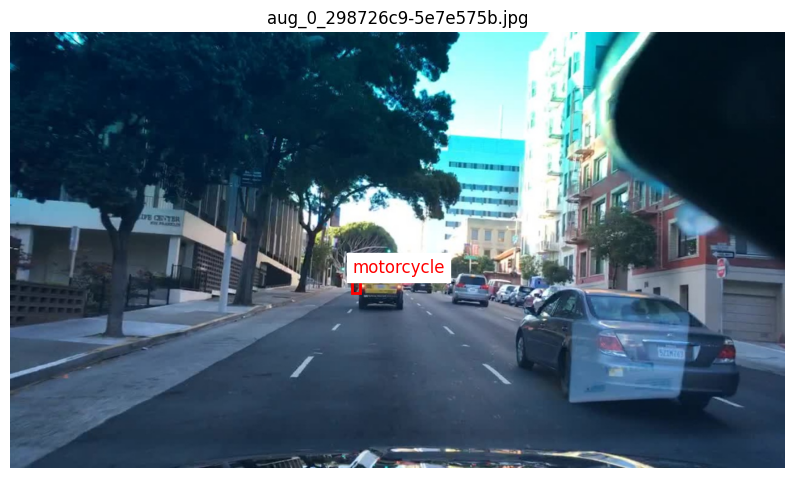

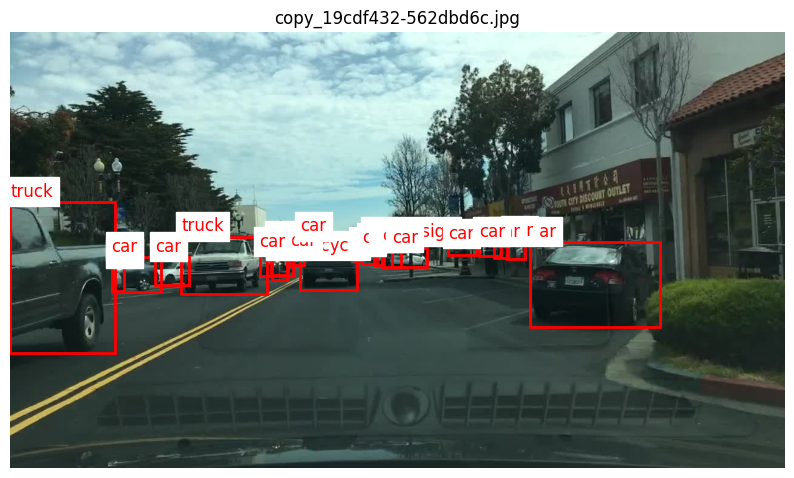

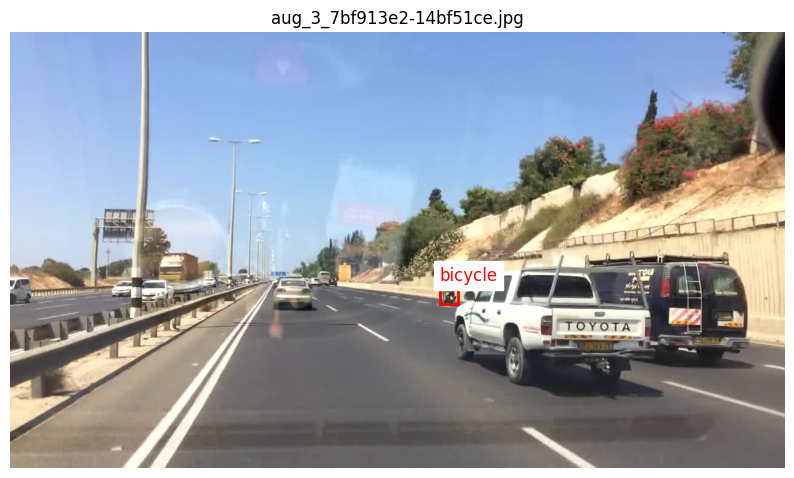

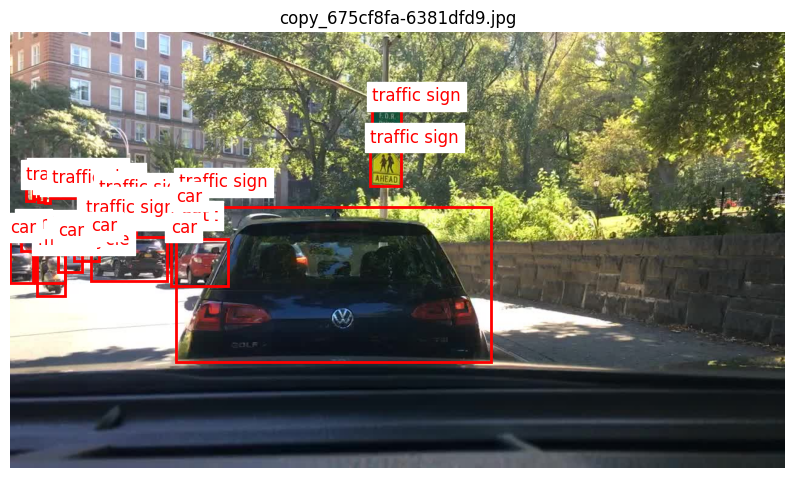

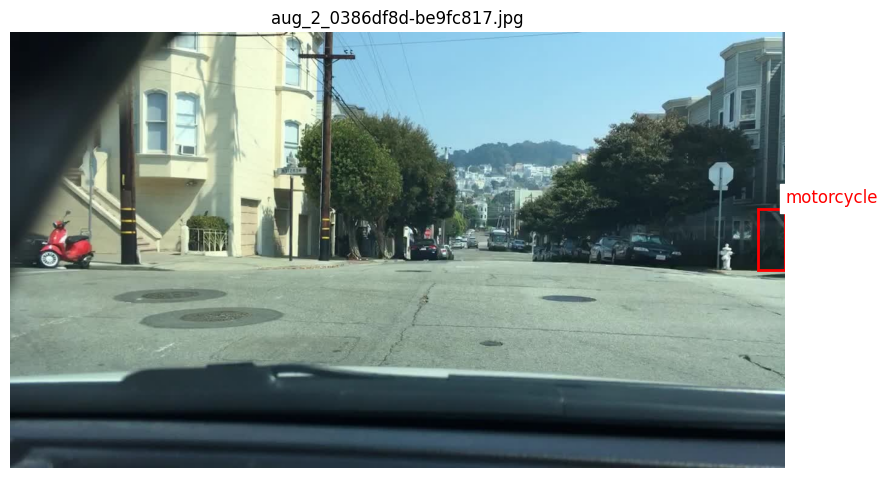

In [ ]:
# Path to merged images and annotations
merged_images_path = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/merged_images'

# Randomly visualizing images with annotations
def visualize_random_samples(annotations, num_samples=5):
    for _ in range(num_samples):
        annotation = random.choice(annotations)
        image_name = annotation['name']
        image_path = os.path.join(merged_images_path, image_name)

        if not os.path.exists(image_path):
            print(f"Image {image_name} not found, skipping...")
            continue

        # Loading image
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Plotting image with bounding boxes
        plt.figure(figsize=(10, 8))
        plt.imshow(image)

        for label in annotation.get('labels', []):
            bbox = label['box2d']
            x1, y1, x2, y2 = bbox['x1'], bbox['y1'], bbox['x2'], bbox['y2']
            category = label['category']

            # Drawing rectangle
            plt.gca().add_patch(
                plt.Rectangle((x1, y1), x2 - x1, y2 - y1, edgecolor='red', facecolor='none', linewidth=2)
            )
            # Adding label text
            plt.text(x1, y1 - 10, category, color='red', fontsize=12, backgroundcolor='white')

        plt.title(image_name)
        plt.axis('off')
        plt.show()

# Visualizing random samples
visualize_random_samples(merged_annotations, num_samples=5)


# Cleaning  bounding boxes of customized dataset

In [ ]:
import json
import os

# Defining paths
merged_annotations_path = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/labels/merged_annotations.json'
output_cleaned_annotations_path = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/labels/cleaned_annotations.json'

# Loading merged annotations
with open(merged_annotations_path, 'r') as f:
    merged_annotations = json.load(f)

# Initializing cleaned annotations
cleaned_annotations = []

# Iterating through annotations and verify bounding boxes
for annotation in merged_annotations:
    image_name = annotation['name']
    labels = annotation['labels']

    # Checking and fix bounding boxes
    valid_labels = []
    for label in labels:
        bbox = label['box2d']
        x1, y1, x2, y2 = bbox['x1'], bbox['y1'], bbox['x2'], bbox['y2']

        # Ensuring coordinates are within valid range
        x1 = max(0, x1)
        y1 = max(0, y1)
        x2 = max(0, x2)
        y2 = max(0, y2)

        # Ensuring bounding box width and height are positive
        if x2 > x1 and y2 > y1:
            valid_labels.append({
                "category": label['category'],
                "box2d": {"x1": x1, "y1": y1, "x2": x2, "y2": y2}
            })
        else:
            print(f"Invalid bounding box in {image_name}: {bbox}")

    # If valid labels remain, add to cleaned annotations
    if valid_labels:
        cleaned_annotations.append({"name": image_name, "labels": valid_labels})
    else:
        print(f"Skipping image {image_name} due to no valid bounding boxes.")

# Saving cleaned annotations
with open(output_cleaned_annotations_path, 'w') as f:
    json.dump(cleaned_annotations, f)

print(f"Cleaned annotations saved to {output_cleaned_annotations_path}")


Streaming output truncated to the last 5000 lines.
Skipping image aug_1_7e36ad82-91a9452d.jpg due to no valid bounding boxes.
Invalid bounding box in aug_4_7e5953c8-c117a59f.jpg: {'x1': 1280, 'y1': 437.8168058395386, 'x2': 610.4912567138672, 'y2': 572.3916435241699}
Skipping image aug_4_7e5953c8-c117a59f.jpg due to no valid bounding boxes.
Invalid bounding box in aug_3_7e63d580-7260051f.jpg: {'x1': 1280, 'y1': 310.49421072006226, 'x2': 592.3123168945312, 'y2': 320.92000007629395}
Skipping image aug_3_7e63d580-7260051f.jpg due to no valid bounding boxes.
Invalid bounding box in aug_3_7e69d47c-10fe8f66.jpg: {'x1': 1280, 'y1': 278.5422992706299, 'x2': 343.0339050292969, 'y2': 295.15257596969604}
Invalid bounding box in aug_3_7e69d47c-10fe8f66.jpg: {'x1': 1280, 'y1': 304.0966057777405, 'x2': 1011.7298126220703, 'y2': 336.0394835472107}
Skipping image aug_3_7e69d47c-10fe8f66.jpg due to no valid bounding boxes.
Invalid bounding box in aug_4_7e69d47c-10fe8f66.jpg: {'x1': 1280, 'y1': 333.69458

# Verifying number of classes in the new dataset

In [ ]:
from collections import Counter

class_counts = Counter()
for annotation in cleaned_annotations:
    for label in annotation['labels']:
        class_counts[label['category']] += 1

print("Class distribution in cleaned dataset:")
for category, count in class_counts.items():
    print(f"{category}: {count}")


Class distribution in cleaned dataset:
pedestrian: 29456
car: 159250
rider: 3501
motorcycle: 12326
traffic light: 47961
traffic sign: 61238
bus: 4216
bicycle: 9971
truck: 10392
other vehicle: 1559
train: 15736
other person: 16
trailer: 7522


# Displaying 5 first images with cleaned bounding boxes

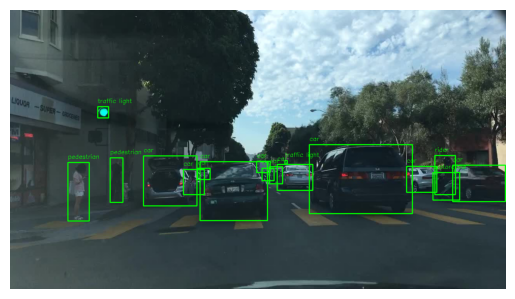

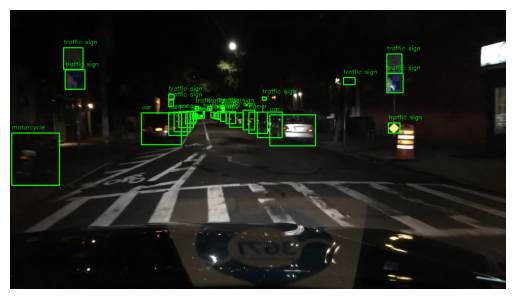

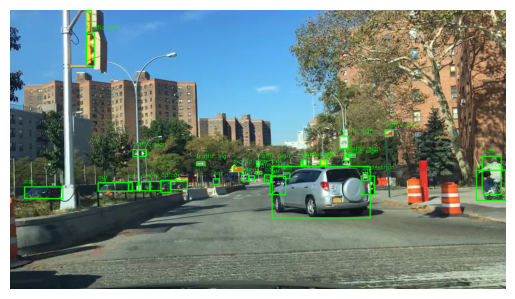

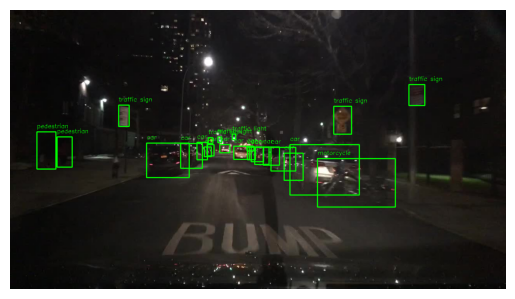

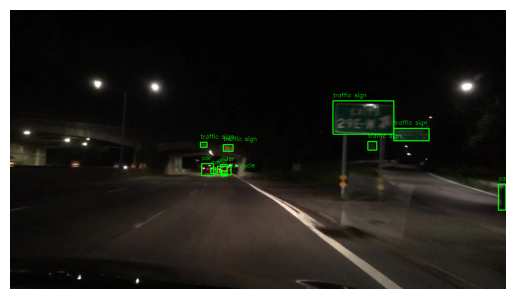

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Path to images
images_path = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/merged_images'

for annotation in cleaned_annotations[:5]:  # Visualize first 5 images
    image_path = os.path.join(images_path, annotation['name'])

    # Check if the file exists
    if not os.path.exists(image_path):
        print(f"Image not found: {image_path}")
        continue

    image = cv2.imread(image_path)
    if image is None:
        print(f"Failed to load image: {image_path}")
        continue

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    for label in annotation['labels']:
        bbox = label['box2d']
        x1, y1, x2, y2 = int(bbox['x1']), int(bbox['y1']), int(bbox['x2']), int(bbox['y2'])
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green bounding box
        cv2.putText(image, label['category'], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

    plt.imshow(image)
    plt.axis('off')
    plt.show()


# Checking valid cleaned annotations

In [ ]:
valid_annotations = []
for annotation in cleaned_annotations:
    valid_labels = []
    for label in annotation['labels']:
        bbox = label['box2d']
        if bbox['x1'] >= 0 and bbox['y1'] >= 0 and bbox['x2'] > bbox['x1'] and bbox['y2'] > bbox['y1']:
            valid_labels.append(label)
        else:
            print(f"Invalid bbox in {annotation['name']}: {bbox}")
    if valid_labels:
        annotation['labels'] = valid_labels
        valid_annotations.append(annotation)

print(f"Valid annotations count: {len(valid_annotations)}")


Valid annotations count: 24874


# Displaying 10 random images with cleaned bounding boxes

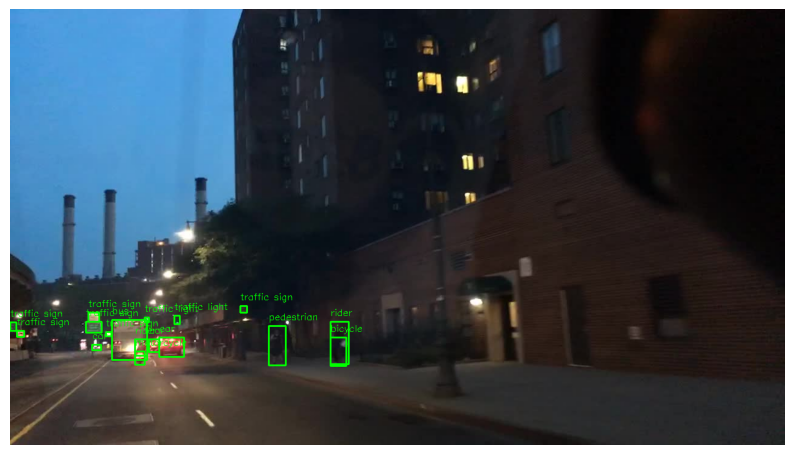

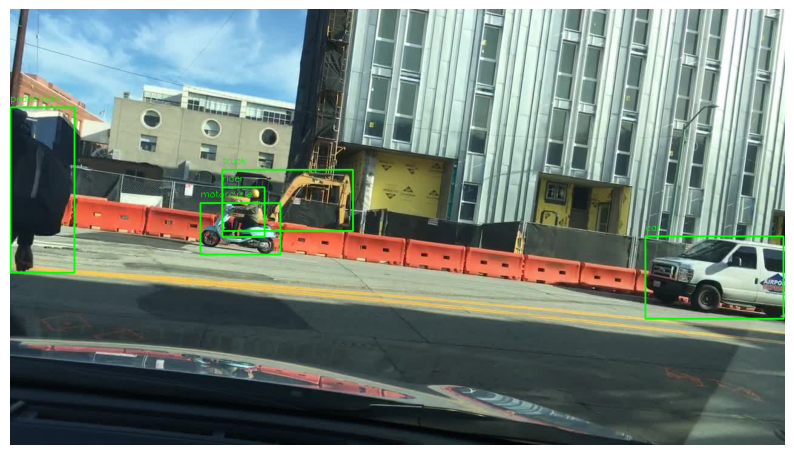

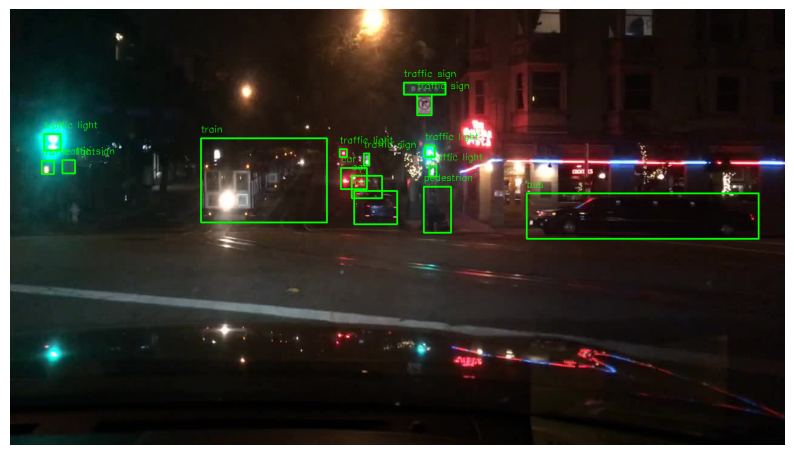

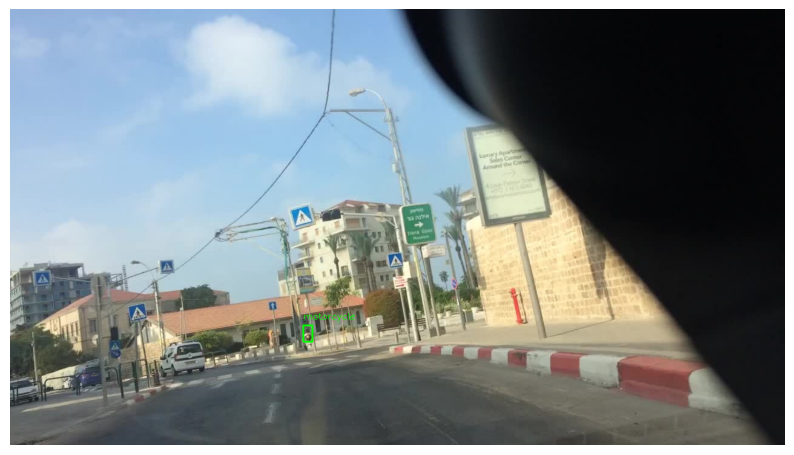

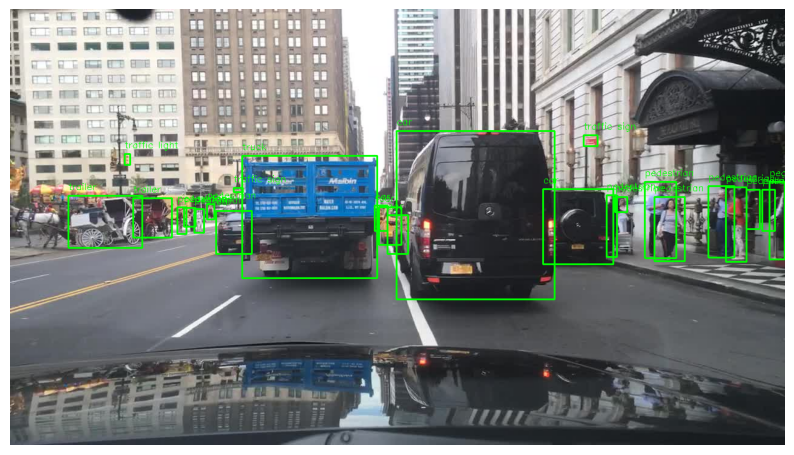

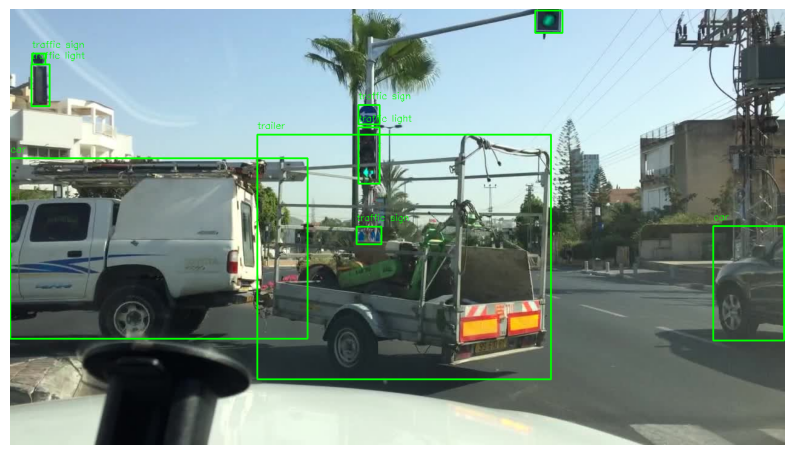

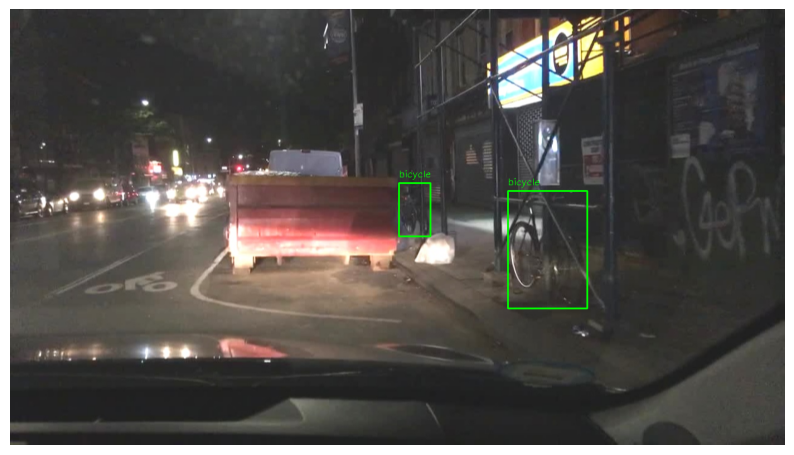

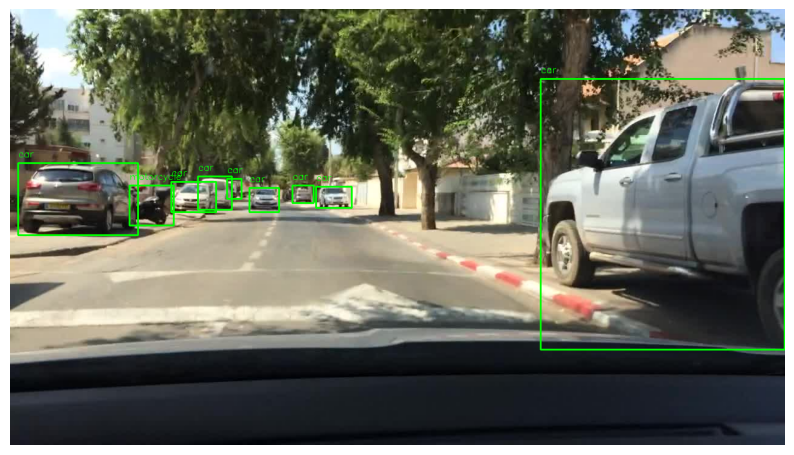

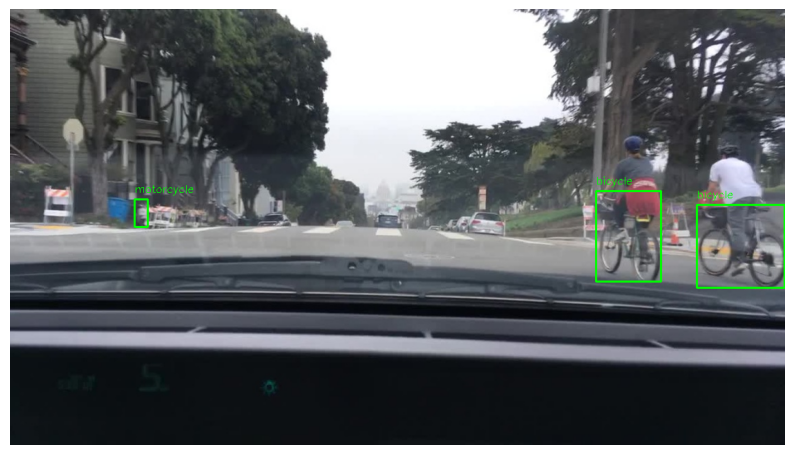

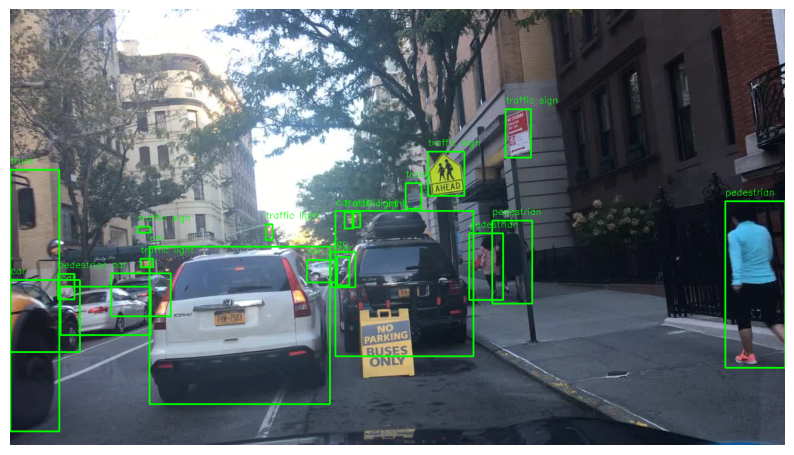

In [ ]:
import cv2
import random
import matplotlib.pyplot as plt

# Path to images
images_path = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/merged_images'

# Randomly selecting 10 images
random_annotations = random.sample(cleaned_annotations, min(10, len(cleaned_annotations)))

for annotation in random_annotations:
    image_path = os.path.join(images_path, annotation['name'])

    # Checking if the file exists
    if not os.path.exists(image_path):
        print(f"Image not found: {image_path}")
        continue

    image = cv2.imread(image_path)
    if image is None:
        print(f"Failed to load image: {image_path}")
        continue

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    for label in annotation['labels']:
        bbox = label['box2d']
        x1, y1, x2, y2 = int(bbox['x1']), int(bbox['y1']), int(bbox['x2']), int(bbox['y2'])
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green bounding box
        cv2.putText(image, label['category'], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

    plt.figure(figsize=(10, 6))
    plt.imshow(image)
    plt.axis('off')
    plt.show()


# Splitting new dataset in training and validation sets

In [ ]:
import os
import shutil
import random
import json

# Paths
base_path = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project'
images_path = os.path.join(base_path, 'merged_images')
labels_path = os.path.join(base_path, 'labels/merged_annotations.json')

# Defining new paths for merged dataset splits
merged_train_path = os.path.join(base_path, 'images', 'merged_train')
merged_val_path = os.path.join(base_path, 'images', 'merged_val')

merged_train_labels_path = os.path.join(base_path, 'labels', 'merged_train')
merged_val_labels_path = os.path.join(base_path, 'labels', 'merged_val')

# Creating directories
for split_path in [merged_train_path, merged_val_path, merged_train_labels_path, merged_val_labels_path]:
    os.makedirs(split_path, exist_ok=True)

# Splitting ratios
train_ratio = 0.8  # 80% for training
val_ratio = 0.2    # 20% for validation

# Loading merged annotations
with open(labels_path, 'r') as f:
    annotations = json.load(f)

# Shuffling data
random.seed(42)  # To ensure reproducibility
random.shuffle(annotations)

# Computing split indices
total_count = len(annotations)
train_count = int(total_count * train_ratio)
val_count = total_count - train_count

# Splitting data
train_annotations = annotations[:train_count]
val_annotations = annotations[train_count:]

# Helper function to copy files and save annotations
def save_split(annotations, split_name, image_dest_path, label_dest_path):
    for annotation in annotations:
        image_name = annotation['name']
        label_name = os.path.splitext(image_name)[0] + '.json'

        # Copying image
        src_image_path = os.path.join(images_path, image_name)
        dst_image_path = os.path.join(image_dest_path, image_name)
        if os.path.exists(src_image_path):
            shutil.copy(src_image_path, dst_image_path)
        else:
            print(f"Image not found: {src_image_path}")

        # Saving label
        label_path = os.path.join(label_dest_path, label_name)
        with open(label_path, 'w') as f:
            json.dump([annotation], f)

# Saving splits
print("Saving training data...")
save_split(train_annotations, 'train', merged_train_path, merged_train_labels_path)
print("Saving validation data...")
save_split(val_annotations, 'val', merged_val_path, merged_val_labels_path)

print("Dataset split complete!")
print(f"Train: {len(train_annotations)}, Val: {len(val_annotations)}")



Saving training data...
Saving validation data...
Dataset split complete!
Train: 25303, Val: 6326


# Converting data into .txt format for YOLOv8 model (Object detection)

In [ ]:
import os
import json

# Category-to-YOLO-class-ID mapping
categories_mapping = {
    "pedestrian": 0,
    "car": 1,
    "rider": 2,
    "motorcycle": 3,
    "traffic light": 4,
    "traffic sign": 5,
    "bus": 6,
    "bicycle": 7,
    "truck": 8,
    "other vehicle": 9,
    "train": 10,
    "other person": 11,
    "trailer": 12
}

def convert_annotations_to_yolo(json_dir, output_dir, images_dir):
    # Ensuring output directory exists
    os.makedirs(output_dir, exist_ok=True)

    for json_file in os.listdir(json_dir):
        json_path = os.path.join(json_dir, json_file)

        # Skipping if it's not a file
        if not os.path.isfile(json_path):
            continue

        # Checking if the corresponding .txt file already exists
        txt_file_name = os.path.splitext(json_file)[0] + '.txt'
        txt_file_path = os.path.join(output_dir, txt_file_name)
        if os.path.exists(txt_file_path):
            print(f"Annotation for {json_file} already exists, skipping...")
            continue

        # Opening the JSON file and process annotations
        with open(json_path, 'r') as f:
            annotations_list = json.load(f)

        for annotation in annotations_list:
            image_name = annotation['name']
            image_path = os.path.join(images_dir, image_name)

            if not os.path.exists(image_path):
                print(f"Image {image_name} not found, skipping...")
                continue

            # Preparing YOLO annotation file
            yolo_annotation = []
            for label in annotation.get('labels', []):
                category = label['category']
                bbox = label['box2d']
                x1, y1, x2, y2 = bbox['x1'], bbox['y1'], bbox['x2'], bbox['y2']

                # Calculating bounding box dimensions
                bbox_width = x2 - x1
                bbox_height = y2 - y1

                # Skipping invalid bounding boxes with zero or negative dimensions
                if bbox_width <= 0 or bbox_height <= 0:
                    print(f"Invalid bounding box for {image_name}, skipping...")
                    continue

                # Mapping class name to YOLO class ID
                class_id = categories_mapping[category]

                # Loading image dimensions
                with open(image_path, 'rb') as img_file:
                    image = cv2.imread(image_path)
                    image_height, image_width = image.shape[:2]

                # Converting bbox to YOLO format
                x_center = ((x1 + x2) / 2) / image_width
                y_center = ((y1 + y2) / 2) / image_height
                bbox_width /= image_width
                bbox_height /= image_height

                # Adding to YOLO annotation
                yolo_annotation.append(f"{class_id} {x_center:.6f} {y_center:.6f} {bbox_width:.6f} {bbox_height:.6f}")

            # Writing YOLO annotations to a .txt file
            if yolo_annotation:  # Ensure there is at least one valid annotation
                with open(txt_file_path, 'a') as txt_file:
                    txt_file.write('\n'.join(yolo_annotation) + '\n')
                print(f"Processed: {image_name} -> {txt_file_path}")
            else:
                print(f"No valid annotations for {image_name}, skipping...")

# Paths
base_path = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project'
train_annotations_dir = os.path.join(base_path, 'labels/merged_train')
val_annotations_dir = os.path.join(base_path, 'labels/merged_val')
train_images_dir = os.path.join(base_path, 'images/merged_train')
val_images_dir = os.path.join(base_path, 'images/merged_val')
yolov8_train_labels_dir = os.path.join(base_path, 'labels/yolov8_merged_train')
yolov8_val_labels_dir = os.path.join(base_path, 'labels/yolov8_merged_val')

# Converting annotations
convert_annotations_to_yolo(train_annotations_dir, yolov8_train_labels_dir, train_images_dir)
convert_annotations_to_yolo(val_annotations_dir, yolov8_val_labels_dir, val_images_dir)



Streaming output truncated to the last 5000 lines.
No valid annotations for aug_1_8dde0dc2-1ba86693.jpg, skipping...
Processed: aug_3_6fe10940-8db4f382.jpg -> /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/labels/yolov8_merged_val/aug_3_6fe10940-8db4f382.txt
Processed: aug_0_6b2591b3-1ccc5250.jpg -> /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/labels/yolov8_merged_val/aug_0_6b2591b3-1ccc5250.txt
Invalid bounding box for aug_1_885e40c3-b92c446c.jpg, skipping...
No valid annotations for aug_1_885e40c3-b92c446c.jpg, skipping...
Invalid bounding box for aug_3_a370a2c5-c518b551.jpg, skipping...
No valid annotations for aug_3_a370a2c5-c518b551.jpg, skipping...
Processed: copy_002d290d-89f4e5c0.jpg -> /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/labels/yolov8_merged_val/copy_002d290d-89f4e5c0.txt
Invalid bounding box for aug_3_a2199999-d20b9f33.jpg, skipping...
Invalid bounding box for aug_3_a2199999-d20b9f33.jpg, skipping...
No valid annota

## Creating YOLOv8 images for train and val directories

In [ ]:
import os

# Base path
base_path = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project'

# Paths for YOLOv8 labels
train_labels_dir = os.path.join(base_path, 'labels/yolov8_merged_train')
val_labels_dir = os.path.join(base_path, 'labels/yolov8_merged_val')

# Paths for original merged images
merged_train_images_dir = os.path.join(base_path, 'images/merged_train')
merged_val_images_dir = os.path.join(base_path, 'images/merged_val')

# Paths for YOLOv8 images
yolov8_train_images_dir = os.path.join(base_path, 'images/yolov8_merged_train')
yolov8_val_images_dir = os.path.join(base_path, 'images/yolov8_merged_val')

# Create YOLOv8 directories for images
os.makedirs(yolov8_train_images_dir, exist_ok=True)
os.makedirs(yolov8_val_images_dir, exist_ok=True)
print(f"Directories created:\n{yolov8_train_images_dir}\n{yolov8_val_images_dir}")


Directories created:
/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/images/yolov8_merged_train
/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/images/yolov8_merged_val


## Copying images to YOLOv8 Train and val directories based on txt labels.

In [ ]:
import shutil
import glob

def copy_images(label_dir, source_image_dir, target_image_dir):
    # List all label files
    label_files = glob.glob(os.path.join(label_dir, '*.txt'))

    for label_file in label_files:
        # Extract the image name from the label file
        image_name = os.path.splitext(os.path.basename(label_file))[0] + '.jpg'
        source_image_path = os.path.join(source_image_dir, image_name)
        target_image_path = os.path.join(target_image_dir, image_name)

        # Copy the image if it exists
        if os.path.exists(source_image_path):
            shutil.copy2(source_image_path, target_image_path)
        else:
            print(f"Image not found for label: {image_name}")

# Copy train and validation images
copy_images(train_labels_dir, merged_train_images_dir, yolov8_train_images_dir)
copy_images(val_labels_dir, merged_val_images_dir, yolov8_val_images_dir)

print("Image copying completed!")


Image copying completed!


## Verifying copied data

In [ ]:
def verify_copy(image_dir, label_dir):
    image_count = len(os.listdir(image_dir))
    label_count = len(os.listdir(label_dir))

    print(f"Images in {image_dir}: {image_count}, Labels in {label_dir}: {label_count}")

# Verify both train and validation directories
verify_copy(yolov8_train_images_dir, train_labels_dir)
verify_copy(yolov8_val_images_dir, val_labels_dir)


Images in /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/images/yolov8_merged_train: 12919, Labels in /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/labels/yolov8_merged_train: 12919
Images in /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/images/yolov8_merged_val: 2273, Labels in /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/labels/yolov8_merged_val: 2273


# Visualization on train set in Yolov8 format

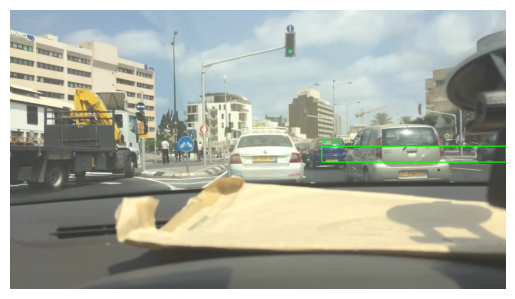

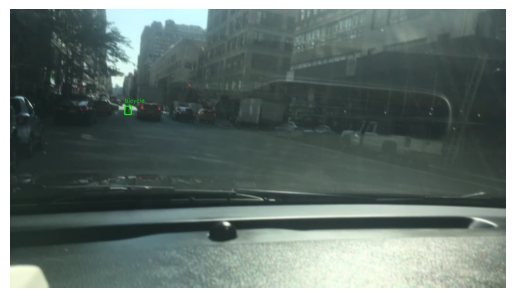

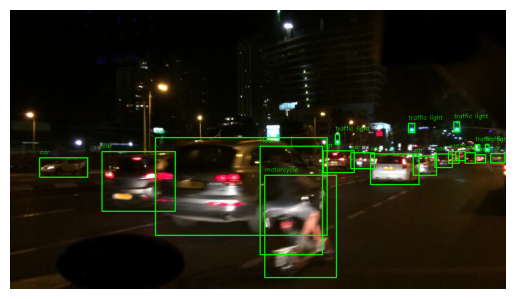

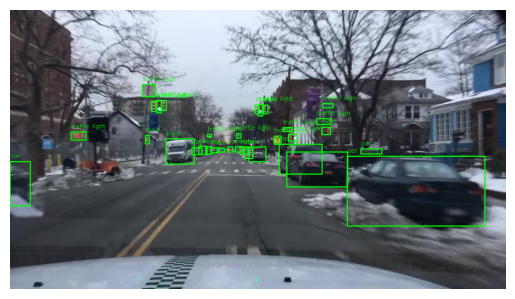

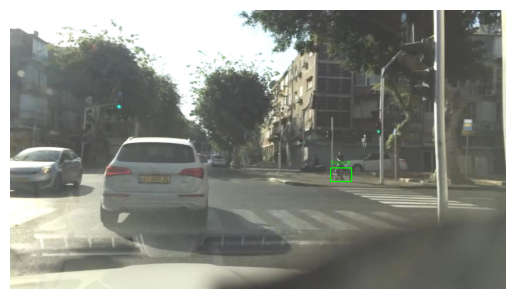

In [ ]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Paths to YOLOv8 train images and labels
images_dir = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/images/yolov8_merged_train'
labels_dir = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/labels/yolov8_merged_train'

# Loading categories mapping (update this with your mapping if needed)
categories = {
    0: 'pedestrian',
    1: 'car',
    2: 'rider',
    3: 'motorcycle',
    4: 'traffic light',
    5: 'traffic sign',
    6: 'bus',
    7: 'bicycle',
    8: 'truck',
    9: 'other vehicle',
    10: 'train',
    11: 'other person',
    12: 'trailer'
}

# Function to visualize an image with bounding boxes
def visualize_image(image_path, label_path):
    # Read the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Failed to load image: {image_path}")
        return

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Reading the label file
    with open(label_path, 'r') as f:
        lines = f.readlines()

    # Drawing bounding boxes
    for line in lines:
        values = line.strip().split()
        category_id = int(values[0])
        x_center, y_center, width, height = map(float, values[1:])

        # Converting YOLO format to image coordinates
        img_height, img_width = image.shape[:2]
        x1 = int((x_center - width / 2) * img_width)
        y1 = int((y_center - height / 2) * img_height)
        x2 = int((x_center + width / 2) * img_width)
        y2 = int((y_center + height / 2) * img_height)

        # Drawing rectangle and label
        color = (0, 255, 0)  # Green bounding box
        cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
        label = categories.get(category_id, f"Unknown({category_id})")
        cv2.putText(image, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

    # Displaying the image
    plt.imshow(image)
    plt.axis('off')
    plt.show()

# Visualizing random images
random_samples = random.sample(os.listdir(images_dir), 5)
    image_path = os.path.join(images_dir, image_name)
    label_name = os.path.splitext(image_name)[0] + '.txt'
    label_path = os.path.join(labels_dir, label_name)

    if os.path.exists(label_path):
        visualize_image(image_path, label_path)
    else:
        print(f"No label file found for {image_name}")


# Visualization on val set in Yolov8 format

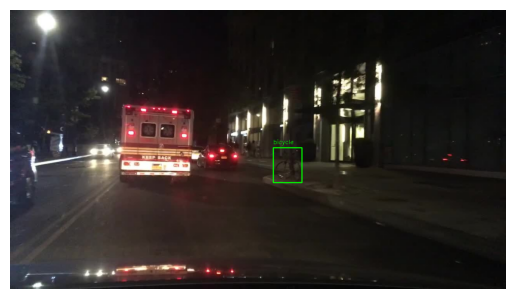

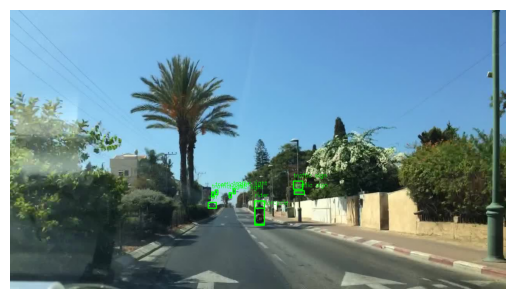

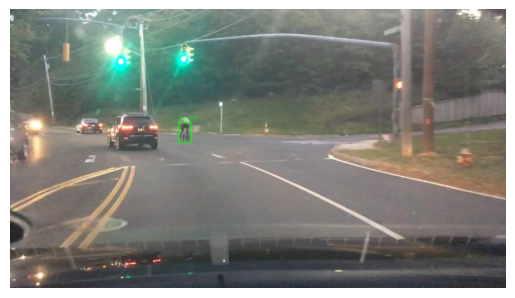

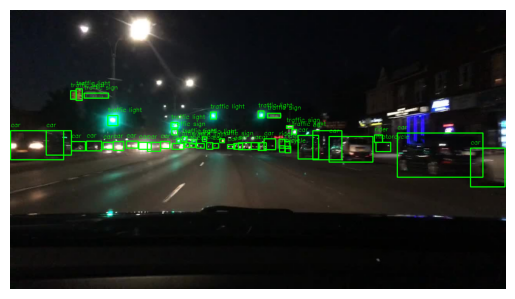

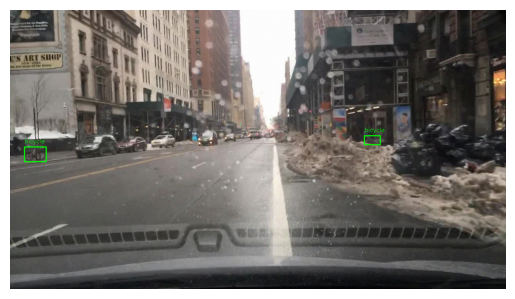

In [ ]:
# Paths to YOLOv8 train images and labels
images_dir = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/images/yolov8_merged_val'
labels_dir = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/labels/yolov8_merged_val'

# Loading categories mapping (update this with your mapping if needed)
categories = {
    0: 'pedestrian',
    1: 'car',
    2: 'rider',
    3: 'motorcycle',
    4: 'traffic light',
    5: 'traffic sign',
    6: 'bus',
    7: 'bicycle',
    8: 'truck',
    9: 'other vehicle',
    10: 'train',
    11: 'other person',
    12: 'trailer'
}

# Function to visualize an image with bounding boxes
def visualize_image(image_path, label_path):
    # Reading the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Failed to load image: {image_path}")
        return

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Reading the label file
    with open(label_path, 'r') as f:
        lines = f.readlines()

    # Drawing bounding boxes
    for line in lines:
        values = line.strip().split()
        category_id = int(values[0])
        x_center, y_center, width, height = map(float, values[1:])

        # Converting YOLO format to image coordinates
        img_height, img_width = image.shape[:2]
        x1 = int((x_center - width / 2) * img_width)
        y1 = int((y_center - height / 2) * img_height)
        x2 = int((x_center + width / 2) * img_width)
        y2 = int((y_center + height / 2) * img_height)

        # Drawing rectangle and label
        color = (0, 255, 0)  # Green bounding box
        cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
        label = categories.get(category_id, f"Unknown({category_id})")
        cv2.putText(image, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

    # Displaying the image
    plt.imshow(image)
    plt.axis('off')
    plt.show()

# Visualizing random images
random_samples = random.sample(os.listdir(images_dir), 5)
for image_name in random_samples:
    image_path = os.path.join(images_dir, image_name)
    label_name = os.path.splitext(image_name)[0] + '.txt'
    label_path = os.path.join(labels_dir, label_name)

    if os.path.exists(label_path):
        visualize_image(image_path, label_path)
    else:
        print(f"No label file found for {image_name}")

# Creating data.yaml file for YOLOV8 training

```
train: /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/yolov8_merged_train/images
val: /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/yolov8_merged_val/images
test: /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/images/test

names:
  0: pedestrian
  1: car
  2: rider
  3: motorcycle
  4: traffic_light
  5: traffic_sign
  6: bus
  7: bicycle
  8: truck
  9: other_vehicle
  10: train
  11: other_person
  12: trailer

```


In [ ]:
import yaml

# Path to your data.yaml file
data_yaml_path = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/data.yaml'

# Reading and printing the YAML content
with open(data_yaml_path, 'r') as file:
    data = yaml.safe_load(file)

print(yaml.dump(data, default_flow_style=False))


names:
  0: pedestrian
  1: car
  2: rider
  3: motorcycle
  4: traffic_light
  5: traffic_sign
  6: bus
  7: bicycle
  8: truck
  9: other_vehicle
  10: train
  11: other_person
  12: trailer
test: /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/images/test
train: /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/images/yolov8_merged_train
val: /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/images/yolov8_merged_val



# Initiating training

In [ ]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.8/898.8 kB 53.8 MB/s eta 0:00:00


In [ ]:
import os

# Defining the path
project_path = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/training_results'

# Creating the directory if it doesn't exist
os.makedirs(project_path, exist_ok=True)


In [ ]:
from ultralytics import YOLO

# Path to the YOLOv8 model
model = YOLO('yolov8n.pt')  # You can use 'yolov8s.pt', 'yolov8m.pt', etc., depending on your needs.

# Path to the data.yaml
data_yaml_path = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/data.yaml'

# Train the model
model.train(
    data=data_yaml_path,
    epochs=50,
    imgsz=640,
    batch=16,
    project='/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/training_results',  # Custom location
    name='yolov8_custom',  # Name of the experiment
    device=0  # Set to 0 for GPU, 'cpu' for CPU
)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 6.25M/6.25M [00:00<00:00, 316MB/s]


Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/training_results, name=yolov8_custom, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None,

100%|██████████| 755k/755k [00:00<00:00, 130MB/s]


Overriding model.yaml nc=80 with nc=13

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 386MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/labels/yolov8_merged_train... 12919 images, 0 backgrounds, 189 corrupt: 100%|██████████| 12919/12919 [03:52<00:00, 55.60it/s] 

train: WARNING ⚠️ /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/images/yolov8_merged_train/aug_0_0090c713-683fc99a.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0018]
train: WARNING ⚠️ /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/images/yolov8_merged_train/aug_0_0492b183-725063b0.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0628]
train: WARNING ⚠️ /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/images/yolov8_merged_train/aug_0_04f802d2-1852c8e6.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0548]
train: WARNING ⚠️ /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/images/yolov8_merged_train/aug_0_0ea1c25a-f3e28278.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0325]
train: WARNING ⚠️ /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/images/yolov8_merge

train: New cache created: /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/labels/yolov8_merged_train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/labels/yolov8_merged_val... 2273 images, 0 backgrounds, 186 corrupt: 100%|██████████| 2273/2273 [00:39<00:00, 57.41it/s] 

val: WARNING ⚠️ /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/images/yolov8_merged_val/aug_0_07398e6d-7b0dc522.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     7.8704      6.3778       12.52         8.9      19.073        10.3]
val: WARNING ⚠️ /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/images/yolov8_merged_val/aug_0_09281e18-7dbbe5b8.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     29.417]
val: WARNING ⚠️ /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/images/yolov8_merged_val/aug_0_0e9015eb-4a307dcf.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     13.504        9.56]
val: WARNING ⚠️ /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/images/yolov8_merged_val/aug_0_0f5a5056-16913cde.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     24.307      15.089      24.173      13.719      16.9

val: New cache created: /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/labels/yolov8_merged_val.cache
Plotting labels to /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/training_results/yolov8_custom/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000588, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/training_results/yolov8_custom
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      3.31G      1.993      3.449      1.354         81        640: 100%|██████████| 796/796 [02:18<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:13<00:00,  4.76it/s]


                   all       2087      19598      0.483      0.129      0.091     0.0448

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      3.24G      1.937        2.8      1.355         57        640: 100%|██████████| 796/796 [02:12<00:00,  6.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.36it/s]


                   all       2087      19598      0.319      0.139      0.101     0.0479

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      3.24G      1.933      2.632      1.363        117        640: 100%|██████████| 796/796 [02:09<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.40it/s]


                   all       2087      19598      0.318      0.152     0.0999     0.0476

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50       2.9G      1.901      2.504       1.34         42        640: 100%|██████████| 796/796 [02:09<00:00,  6.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.30it/s]


                   all       2087      19598      0.449      0.148      0.127     0.0603

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.89G      1.869      2.447      1.326        185        640: 100%|██████████| 796/796 [02:08<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:11<00:00,  5.51it/s]


                   all       2087      19598        0.4      0.147      0.137     0.0645

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      3.12G      1.848      2.403      1.316        164        640: 100%|██████████| 796/796 [02:08<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.27it/s]


                   all       2087      19598      0.303      0.151      0.136     0.0643

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      3.01G      1.817      2.348      1.298         75        640: 100%|██████████| 796/796 [02:08<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.39it/s]


                   all       2087      19598      0.391      0.188      0.157     0.0759

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      3.31G      1.806      2.316      1.296         71        640: 100%|██████████| 796/796 [02:08<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.36it/s]


                   all       2087      19598      0.347        0.2      0.163     0.0777

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      3.39G      1.801      2.326      1.293         80        640: 100%|██████████| 796/796 [02:08<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.30it/s]


                   all       2087      19598       0.39      0.194      0.171     0.0841

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50       3.2G       1.79      2.295      1.282         81        640: 100%|██████████| 796/796 [02:08<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.46it/s]


                   all       2087      19598       0.34       0.22      0.172     0.0865

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50       3.6G      1.775      2.259      1.275         77        640: 100%|██████████| 796/796 [02:08<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.38it/s]


                   all       2087      19598      0.363      0.224      0.185     0.0918

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      3.36G      1.765      2.244      1.271        111        640: 100%|██████████| 796/796 [02:08<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.29it/s]


                   all       2087      19598      0.375       0.23      0.192     0.0937

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      3.25G      1.755      2.226      1.267         87        640: 100%|██████████| 796/796 [02:08<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.50it/s]


                   all       2087      19598      0.358      0.223      0.194     0.0987

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      3.13G      1.738        2.2      1.257         93        640: 100%|██████████| 796/796 [02:08<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.40it/s]


                   all       2087      19598      0.387      0.223      0.197      0.101

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50       2.9G      1.722      2.187      1.252         99        640: 100%|██████████| 796/796 [02:08<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.31it/s]


                   all       2087      19598      0.365      0.247      0.205      0.103

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      3.04G      1.716      2.172      1.247        104        640: 100%|██████████| 796/796 [02:08<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:11<00:00,  5.51it/s]


                   all       2087      19598      0.389      0.253       0.21      0.107

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      3.06G      1.711      2.147       1.24        102        640: 100%|██████████| 796/796 [02:08<00:00,  6.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.39it/s]


                   all       2087      19598      0.366      0.246      0.206      0.106

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.74G      1.704      2.138       1.24         84        640: 100%|██████████| 796/796 [02:08<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.42it/s]


                   all       2087      19598      0.401       0.25      0.213      0.109

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      3.33G        1.7      2.137      1.238         42        640: 100%|██████████| 796/796 [02:08<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.44it/s]


                   all       2087      19598      0.383      0.255      0.219      0.113

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      3.31G      1.701      2.139       1.24        131        640: 100%|██████████| 796/796 [02:08<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.32it/s]


                   all       2087      19598      0.386      0.269      0.223      0.117

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      3.18G      1.684      2.095      1.228        129        640: 100%|██████████| 796/796 [02:08<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.37it/s]


                   all       2087      19598      0.411       0.26      0.232      0.121

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      3.07G      1.678      2.093      1.226        182        640: 100%|██████████| 796/796 [02:08<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:11<00:00,  5.52it/s]


                   all       2087      19598      0.391      0.261      0.226      0.119

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      3.15G      1.678       2.08      1.226         65        640: 100%|██████████| 796/796 [02:08<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.33it/s]


                   all       2087      19598      0.406      0.271      0.241      0.129

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.98G      1.666      2.066      1.221         91        640: 100%|██████████| 796/796 [02:08<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.43it/s]


                   all       2087      19598      0.421      0.264      0.239      0.132

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      3.69G      1.667      2.076      1.224         75        640: 100%|██████████| 796/796 [02:08<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.41it/s]


                   all       2087      19598      0.416      0.275      0.239      0.129

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.89G      1.653      2.042      1.213         67        640: 100%|██████████| 796/796 [02:07<00:00,  6.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.44it/s]


                   all       2087      19598      0.408      0.282      0.241      0.131

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      3.36G      1.642      2.019      1.204         92        640: 100%|██████████| 796/796 [02:07<00:00,  6.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.43it/s]


                   all       2087      19598      0.493      0.286      0.255      0.138

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      3.63G      1.646      2.021      1.207         69        640: 100%|██████████| 796/796 [02:08<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.33it/s]


                   all       2087      19598      0.508       0.28      0.256      0.137

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      3.77G      1.631      1.996      1.202         76        640: 100%|██████████| 796/796 [02:08<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.40it/s]


                   all       2087      19598       0.51      0.292      0.261      0.142

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      3.53G      1.641      2.013      1.208        196        640: 100%|██████████| 796/796 [02:07<00:00,  6.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:11<00:00,  5.56it/s]


                   all       2087      19598      0.515      0.294      0.267      0.147

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      3.08G      1.625      1.984      1.199         51        640: 100%|██████████| 796/796 [02:08<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.39it/s]


                   all       2087      19598      0.509      0.306      0.269      0.151

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      3.26G      1.626      1.993      1.199         58        640: 100%|██████████| 796/796 [02:08<00:00,  6.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.39it/s]


                   all       2087      19598       0.52      0.297       0.27      0.151

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      3.05G      1.611      1.975      1.194         97        640: 100%|██████████| 796/796 [02:08<00:00,  6.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:11<00:00,  5.55it/s]


                   all       2087      19598      0.517      0.307      0.277      0.154

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      3.42G      1.609      1.965       1.19         71        640: 100%|██████████| 796/796 [02:08<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.38it/s]


                   all       2087      19598      0.454      0.301      0.281      0.157

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      3.64G      1.611      1.945      1.189        125        640: 100%|██████████| 796/796 [02:08<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.41it/s]


                   all       2087      19598      0.533      0.308      0.278      0.156

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      3.61G      1.603      1.942      1.192         87        640: 100%|██████████| 796/796 [02:08<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.49it/s]


                   all       2087      19598      0.526      0.308      0.286       0.16

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      3.47G      1.598      1.942      1.187         89        640: 100%|██████████| 796/796 [02:08<00:00,  6.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.37it/s]


                   all       2087      19598      0.541      0.309      0.289      0.163

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.85G      1.592      1.917      1.181        136        640: 100%|██████████| 796/796 [02:08<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.40it/s]


                   all       2087      19598      0.526      0.312      0.284       0.16

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      3.08G      1.582      1.911      1.176         81        640: 100%|██████████| 796/796 [02:08<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:11<00:00,  5.52it/s]


                   all       2087      19598      0.527      0.318      0.287      0.165

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.84G      1.571       1.89       1.17        134        640: 100%|██████████| 796/796 [02:07<00:00,  6.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.46it/s]


                   all       2087      19598      0.542       0.32       0.29      0.167
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.42G      1.588      1.876      1.166         22        640: 100%|██████████| 796/796 [02:07<00:00,  6.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.40it/s]


                   all       2087      19598      0.521      0.314      0.281      0.158

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50       2.7G      1.577      1.858      1.164         96        640: 100%|██████████| 796/796 [02:06<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.36it/s]


                   all       2087      19598      0.538       0.31      0.288      0.163

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.92G       1.57      1.836       1.16         97        640: 100%|██████████| 796/796 [02:05<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.36it/s]


                   all       2087      19598      0.539      0.307      0.287      0.164

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50       2.8G      1.569      1.838      1.159         28        640: 100%|██████████| 796/796 [02:05<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.35it/s]


                   all       2087      19598      0.547       0.31      0.292      0.167

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.78G      1.564      1.825      1.155          7        640: 100%|██████████| 796/796 [02:05<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.39it/s]


                   all       2087      19598      0.565      0.307      0.296       0.17

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.74G      1.549      1.802      1.149         29        640: 100%|██████████| 796/796 [02:06<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.38it/s]


                   all       2087      19598      0.567      0.304      0.296       0.17

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.84G      1.546      1.784      1.148         44        640: 100%|██████████| 796/796 [02:05<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.45it/s]


                   all       2087      19598      0.558      0.307      0.294       0.17

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.77G      1.537      1.762      1.146         59        640: 100%|██████████| 796/796 [02:06<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.39it/s]


                   all       2087      19598      0.553      0.311      0.295       0.17

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.54G      1.538      1.756      1.149         28        640: 100%|██████████| 796/796 [02:06<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.47it/s]


                   all       2087      19598      0.551      0.312      0.296      0.171

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.78G      1.532      1.761      1.145         54        640: 100%|██████████| 796/796 [02:05<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:12<00:00,  5.44it/s]


                   all       2087      19598      0.557      0.313      0.298      0.172

50 epochs completed in 1.970 hours.
Optimizer stripped from /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/training_results/yolov8_custom/weights/last.pt, 6.2MB
Optimizer stripped from /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/training_results/yolov8_custom/weights/best.pt, 6.2MB

Validating /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/training_results/yolov8_custom/weights/best.pt...
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,008,183 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:14<00:00,  4.61it/s]


                   all       2087      19598      0.558      0.312      0.298      0.173
            pedestrian        421       1740      0.457      0.256      0.243      0.114
                   car        815       7983      0.496      0.543      0.448      0.279
                 rider        368        492      0.525      0.337      0.326      0.147
            motorcycle       1096       1613      0.661      0.567        0.6      0.326
         traffic_light        501       2382      0.439      0.207       0.21     0.0838
          traffic_sign        699       2948      0.454      0.267      0.251      0.126
                   bus        143        186      0.351      0.333      0.266      0.184
               bicycle       1035       1699      0.566      0.449      0.457      0.242
                 truck        199        305      0.292      0.275        0.2      0.144
         other_vehicle         16         24          1          0     0.0396     0.0243
                 trai

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f19fc546e90>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.04504

# Fine-tuned training

## Fixing corrupt annotations from initial training

In [ ]:
import os

# Paths
train_labels_dir = "/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/labels/yolov8_merged_train"
train_images_dir = "/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/images/yolov8_merged_train"
output_labels_dir = "/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/labels/fixed_yolov8_merged_train"

# Creating output directory if not exists
os.makedirs(output_labels_dir, exist_ok=True)

def clamp(value, min_value=0.0, max_value=1.0):
    """Clamp a value to be within [min_value, max_value]."""
    return max(min(value, max_value), min_value)

# Iterating through label files
for label_file in os.listdir(train_labels_dir):
    label_path = os.path.join(train_labels_dir, label_file)
    output_label_path = os.path.join(output_labels_dir, label_file)

    with open(label_path, "r") as f:
        lines = f.readlines()

    fixed_lines = []
    for line in lines:
        parts = line.strip().split()
        if len(parts) < 5:
            continue  # Skipping invalid lines

        class_id = parts[0]
        x_center = float(parts[1])
        y_center = float(parts[2])
        width = float(parts[3])
        height = float(parts[4])

        # Clamping values to ensure they are within [0, 1]
        x_center = clamp(x_center)
        y_center = clamp(y_center)
        width = clamp(width)
        height = clamp(height)

        # Recomputing bounding box dimensions to ensure validity
        x_min = clamp(x_center - width / 2)
        y_min = clamp(y_center - height / 2)
        x_max = clamp(x_center + width / 2)
        y_max = clamp(y_center + height / 2)

        # Converting back to YOLO format
        x_center = (x_min + x_max) / 2
        y_center = (y_min + y_max) / 2
        width = x_max - x_min
        height = y_max - y_min

        # Skipping if the bounding box is invalid (zero area)
        if width <= 0 or height <= 0:
            continue

        # Adding the fixed line
        fixed_lines.append(f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}\n")

    # Saving fixed labels
    with open(output_label_path, "w") as f:
        f.writelines(fixed_lines)

print(f"Fixed labels saved to {output_labels_dir}")


Fixed labels saved to /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/labels/fixed_yolov8_merged_train


In [ ]:
import os

# Paths
val_labels_dir = "/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/labels/yolov8_merged_val"
val_images_dir = "/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/images/yolov8_merged_val"
output_labels_dir = "/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/labels/fixed_yolov8_merged_val"

# Creating output directory if not exists
os.makedirs(output_labels_dir, exist_ok=True)

def clamp(value, min_value=0.0, max_value=1.0):
    """Clamp a value to be within [min_value, max_value]."""
    return max(min(value, max_value), min_value)

# Iterating through label files
for label_file in os.listdir(val_labels_dir):
    label_path = os.path.join(val_labels_dir, label_file)
    output_label_path = os.path.join(output_labels_dir, label_file)

    with open(label_path, "r") as f:
        lines = f.readlines()

    fixed_lines = []
    for line in lines:
        parts = line.strip().split()
        if len(parts) < 5:
            continue  # Skip invalid lines

        class_id = parts[0]
        x_center = float(parts[1])
        y_center = float(parts[2])
        width = float(parts[3])
        height = float(parts[4])

        # Clamping values to ensure they are within [0, 1]
        x_center = clamp(x_center)
        y_center = clamp(y_center)
        width = clamp(width)
        height = clamp(height)

        # Recomputing bounding box dimensions to ensure validity
        x_min = clamp(x_center - width / 2)
        y_min = clamp(y_center - height / 2)
        x_max = clamp(x_center + width / 2)
        y_max = clamp(y_center + height / 2)

        # Converting back to YOLO format
        x_center = (x_min + x_max) / 2
        y_center = (y_min + y_max) / 2
        width = x_max - x_min
        height = y_max - y_min

        # Skip if the bounding box is invalid (zero area)
        if width <= 0 or height <= 0:
            continue

        # Add the fixed line
        fixed_lines.append(f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}\n")

    # Save fixed labels
    with open(output_label_path, "w") as f:
        f.writelines(fixed_lines)

print(f"Fixed labels saved to {output_labels_dir}")


Fixed labels saved to /content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/labels/fixed_yolov8_merged_val


## Validating fixed annotations

Visualizing aug_2_1edd9c50-bc27fa60.txt...
Class: 7, x_min: 778, y_min: 282, x_max: 1280, y_max: 329


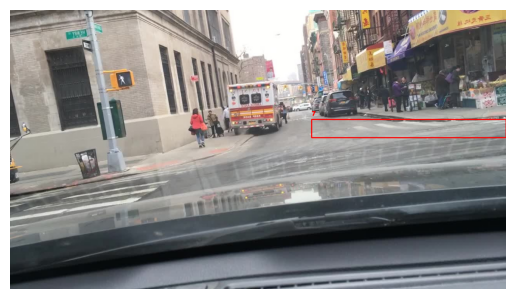

Visualizing aug_3_af04d6a9-a066533b.txt...
Class: 7, x_min: 1142, y_min: 476, x_max: 1280, y_max: 536


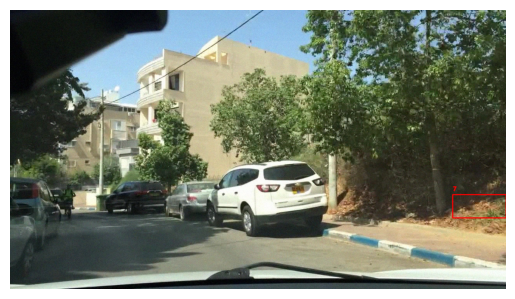

Visualizing aug_1_76549a83-70f585cc.txt...
Class: 3, x_min: 15, y_min: 238, x_max: 69, y_max: 284


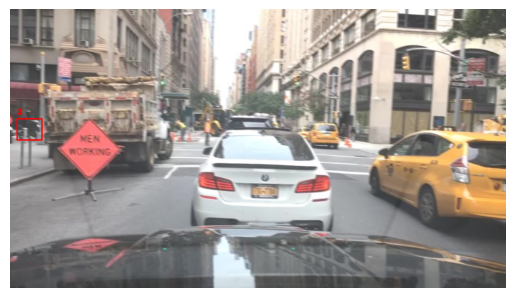

Visualizing aug_0_6b66e427-7e833ca3.txt...
Class: 3, x_min: 667, y_min: 280, x_max: 674, y_max: 290


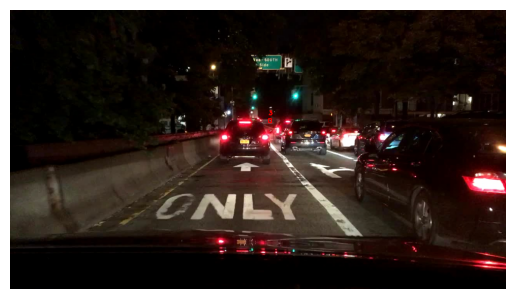

Visualizing copy_4d97e3fb-807fbfb3.txt...
Class: 1, x_min: 782, y_min: 386, x_max: 816, y_max: 426
Class: 1, x_min: 801, y_min: 379, x_max: 873, y_max: 439
Class: 1, x_min: 831, y_min: 384, x_max: 875, y_max: 450
Class: 1, x_min: 845, y_min: 368, x_max: 974, y_max: 467
Class: 1, x_min: 686, y_min: 389, x_max: 731, y_max: 408
Class: 1, x_min: 665, y_min: 385, x_max: 690, y_max: 414
Class: 1, x_min: 628, y_min: 376, x_max: 673, y_max: 417
Class: 1, x_min: 601, y_min: 361, x_max: 648, y_max: 430
Class: 1, x_min: 576, y_min: 371, x_max: 626, y_max: 436
Class: 3, x_min: 351, y_min: 375, x_max: 476, y_max: 492
Class: 1, x_min: 461, y_min: 354, x_max: 593, y_max: 451
Class: 1, x_min: 937, y_min: 349, x_max: 1119, y_max: 544
Class: 1, x_min: 0, y_min: 354, x_max: 385, y_max: 559
Class: 8, x_min: 1085, y_min: 148, x_max: 1278, y_max: 718
Class: 8, x_min: 0, y_min: 474, x_max: 47, y_max: 613
Class: 5, x_min: 718, y_min: 368, x_max: 726, y_max: 379
Class: 5, x_min: 411, y_min: 239, x_max: 436, y_

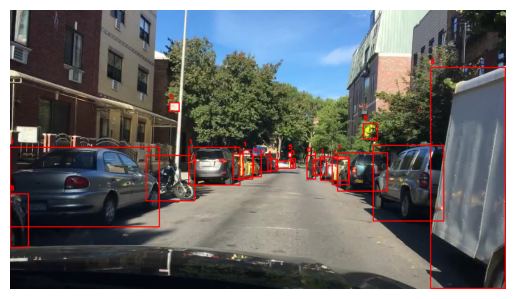

In [ ]:
import cv2
import os
import matplotlib.pyplot as plt

# Paths
images_dir = "/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/images/yolov8_merged_train"
labels_dir = "/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/labels/fixed_yolov8_merged_train"

def visualize_annotations(image_path, label_path):
    # Checking if the image exists
    image = cv2.imread(image_path)
    if image is None:
        print(f"Image not found: {image_path}")
        return

    # Converting image to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    h, w, _ = image.shape

    # Checking if the label file exists and is not empty
    if not os.path.exists(label_path):
        print(f"Label file not found: {label_path}")
        return

    with open(label_path, "r") as f:
        lines = f.readlines()

    if not lines:
        print(f"No annotations found in: {label_path}")
        return

    # Looping through each line in the label file
    for line in lines:
        parts = line.strip().split()
        class_id = int(parts[0])
        x_center = float(parts[1]) * w
        y_center = float(parts[2]) * h
        width = float(parts[3]) * w
        height = float(parts[4]) * h

        x_min = max(0, int(x_center - width / 2))
        y_min = max(0, int(y_center - height / 2))
        x_max = min(w, int(x_center + width / 2))
        y_max = min(h, int(y_center + height / 2))

        print(f"Class: {class_id}, x_min: {x_min}, y_min: {y_min}, x_max: {x_max}, y_max: {y_max}")

        # Drawing bounding box
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        cv2.putText(image, str(class_id), (x_min, max(0, y_min - 10)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    # Displaying the image with bounding boxes
    plt.imshow(image)
    plt.axis("off")
    plt.show()

# Testing visualization for a few images
for file_name in os.listdir(labels_dir)[:5]:
    label_path = os.path.join(labels_dir, file_name)
    image_path = os.path.join(images_dir, file_name.replace(".txt", ".jpg"))

    # Checking if image path exists for multiple formats
    if not os.path.exists(image_path):
        for ext in [".jpg", ".png", ".jpeg"]:
            image_path = os.path.join(images_dir, file_name.replace(".txt", ext))
            if os.path.exists(image_path):
                break

    if os.path.exists(image_path):
        print(f"Visualizing {file_name}...")
        visualize_annotations(image_path, label_path)
    else:
        print(f"Image file not found for {file_name}")


Visualizing aug_2_6d371c29-d1b4f865.txt


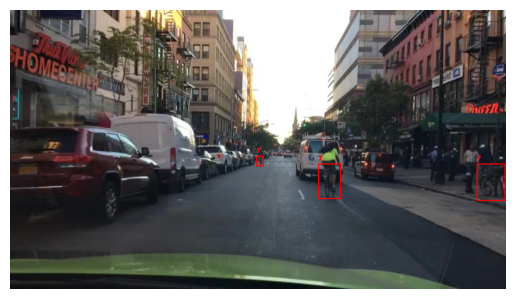

Visualizing aug_4_aad3597b-0bd3737b.txt


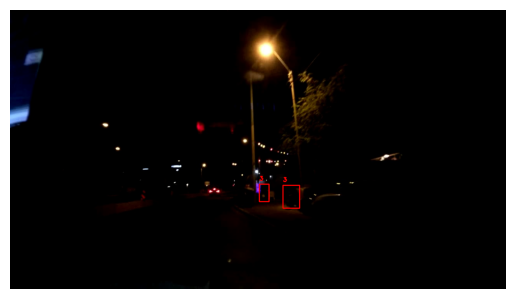

Visualizing copy_1255bb0a-1c43983f.txt


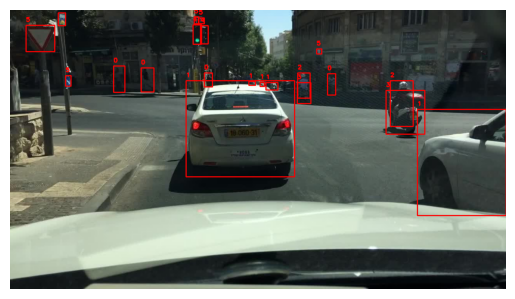

Visualizing aug_0_3232e0fb-2e5efffc.txt


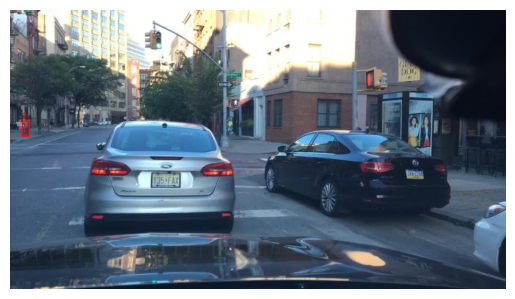

Visualizing aug_2_9cd7a47d-c28dff08.txt


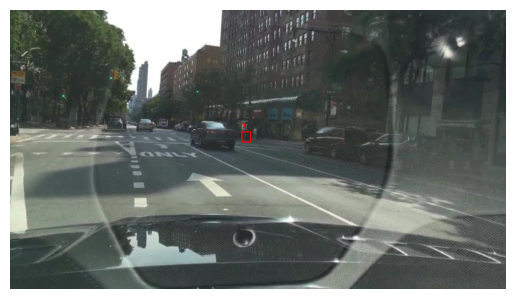

In [ ]:
import cv2
import os
import matplotlib.pyplot as plt

# Paths
images_dir = "/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/images/yolov8_merged_val"
labels_dir = "/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/labels/fixed_yolov8_merged_val"

# Function to visualize bounding boxes
def visualize_annotations(image_path, label_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    h, w, _ = image.shape

    with open(label_path, "r") as f:
        lines = f.readlines()

    for line in lines:
        parts = line.strip().split()
        class_id = int(parts[0])
        x_center = float(parts[1]) * w
        y_center = float(parts[2]) * h
        width = float(parts[3]) * w
        height = float(parts[4]) * h

        x_min = int(x_center - width / 2)
        y_min = int(y_center - height / 2)
        x_max = int(x_center + width / 2)
        y_max = int(y_center + height / 2)

        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        cv2.putText(image, str(class_id), (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    plt.imshow(image)
    plt.axis("off")
    plt.show()

# Test visualization for a few images
for file_name in os.listdir(labels_dir)[:5]:
    image_path = os.path.join(images_dir, file_name.replace(".txt", ".jpg"))
    label_path = os.path.join(labels_dir, file_name)
    if os.path.exists(image_path):
        print(f"Visualizing {file_name}")
        visualize_annotations(image_path, label_path)


## Fine Tuning (Upgrading to YOLOv8s.pt)

In [ ]:
from ultralytics import YOLO

# Loading the YOLOv8 model (upgrade to 'yolov8s.pt')
model = YOLO('yolov8s.pt')

# Defining paths
data_yaml_path = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/data.yaml'

# Training the model
model.train(
    data=data_yaml_path,
    epochs=50,
    imgsz=640,
    batch=16,
    project='/content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/training_results',
    name='yolov8s_custom',
    device=0

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 21.5M/21.5M [00:00<00:00, 401MB/s]


Ultralytics 8.3.44 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=/content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/training_results, name=yolov8s_custom, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None

100%|██████████| 755k/755k [00:00<00:00, 119MB/s]


Overriding model.yaml nc=80 with nc=13

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 323MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/labels/yolov8_merged_train... 7569 images, 5348 backgrounds, 0 corrupt: 100%|██████████| 12917/12917 [23:09<00:00,  9.29it/s]


train: New cache created: /content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/labels/yolov8_merged_train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.22 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/labels/yolov8_merged_val... 2211 images, 62 backgrounds, 0 corrupt: 100%|██████████| 2273/2273 [04:45<00:00,  7.97it/s]


val: New cache created: /content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/labels/yolov8_merged_val.cache
Plotting labels to /content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/training_results/yolov8s_custom/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/training_results/yolov8s_custom
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      4.26G       1.61      3.133      1.137         22        640: 100%|██████████| 808/808 [03:40<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:17<00:00,  4.06it/s]


                   all       2273      20678      0.483      0.171      0.146     0.0784

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      4.31G      1.613      2.279      1.116          6        640: 100%|██████████| 808/808 [03:35<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.62it/s]


                   all       2273      20678      0.344      0.169       0.14     0.0698

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      4.53G      1.734      2.363      1.169        152        640: 100%|██████████| 808/808 [03:33<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.53it/s]


                   all       2273      20678      0.303      0.138     0.0901     0.0411

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      4.46G       1.81      2.398      1.207         43        640: 100%|██████████| 808/808 [03:33<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.59it/s]


                   all       2273      20678       0.36      0.128      0.102     0.0465

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      4.68G      1.764      2.325      1.191         96        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.64it/s]


                   all       2273      20678      0.315      0.146      0.127     0.0601

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      4.24G      1.732      2.266      1.174         39        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.62it/s]


                   all       2273      20678      0.394       0.15      0.136     0.0666

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      4.44G        1.7       2.22      1.164         23        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.61it/s]


                   all       2273      20678      0.248      0.189      0.147     0.0688

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50       4.8G      1.651      2.156      1.138         46        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.62it/s]


                   all       2273      20678       0.46      0.174      0.158     0.0776

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      4.55G      1.634      2.126      1.134         11        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.60it/s]


                   all       2273      20678       0.39      0.219      0.168     0.0826

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      4.66G      1.631      2.127      1.134         40        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.58it/s]


                   all       2273      20678      0.366      0.199      0.173     0.0844

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      4.29G      1.599       2.07      1.119         15        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.62it/s]


                   all       2273      20678      0.413      0.221       0.19     0.0959

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      4.04G      1.588      2.058      1.107         11        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.62it/s]


                   all       2273      20678       0.39      0.237      0.203        0.1

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      4.59G      1.574      2.013      1.106         21        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.66it/s]


                   all       2273      20678      0.351      0.233      0.193     0.0983

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50       4.7G      1.562      1.995        1.1         74        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.63it/s]


                   all       2273      20678      0.389      0.241      0.213      0.108

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      4.48G      1.542      1.953      1.092         44        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.65it/s]


                   all       2273      20678      0.383      0.242      0.218      0.113

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      4.42G      1.538      1.959      1.092         39        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.65it/s]


                   all       2273      20678      0.398      0.259      0.226      0.117

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      4.49G      1.527      1.936      1.084         30        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.62it/s]


                   all       2273      20678       0.39      0.273      0.238      0.124

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      4.44G      1.518      1.922      1.078         63        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.61it/s]


                   all       2273      20678      0.398      0.279      0.239      0.127

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      4.45G      1.498      1.893      1.072         19        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.61it/s]


                   all       2273      20678      0.407      0.292       0.25      0.135

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      4.18G      1.501      1.882       1.07          3        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.62it/s]


                   all       2273      20678      0.404      0.274      0.253      0.135

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      4.54G      1.493      1.864      1.065         77        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.62it/s]


                   all       2273      20678      0.422      0.287       0.26      0.143

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      4.63G       1.48      1.836      1.062         32        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.62it/s]


                   all       2273      20678      0.435      0.308      0.271      0.148

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      4.64G      1.467      1.827      1.057         42        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.60it/s]


                   all       2273      20678      0.434      0.303      0.271       0.15

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      4.49G      1.453      1.806      1.048         56        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.70it/s]


                   all       2273      20678      0.432      0.309      0.285      0.155

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      4.58G      1.442      1.783      1.051         25        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.70it/s]


                   all       2273      20678      0.346      0.278      0.265      0.145

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      4.58G      1.439      1.782      1.047         59        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.63it/s]


                   all       2273      20678      0.444      0.321      0.299      0.167

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      4.79G      1.429      1.765       1.04         23        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.68it/s]


                   all       2273      20678      0.448      0.323      0.296      0.166

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      4.66G      1.418      1.744      1.037         35        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.67it/s]


                   all       2273      20678      0.452       0.34      0.303       0.17

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      4.86G      1.416      1.732      1.033         41        640: 100%|██████████| 808/808 [03:33<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.61it/s]


                   all       2273      20678      0.371      0.346      0.309      0.175

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      4.56G      1.405      1.716      1.028         87        640: 100%|██████████| 808/808 [03:32<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.72it/s]


                   all       2273      20678      0.445       0.35      0.314      0.182

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      4.41G      1.402      1.694      1.029         12        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.63it/s]


                   all       2273      20678      0.453      0.369      0.329      0.192

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      4.79G      1.388      1.693      1.025         13        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.62it/s]


                   all       2273      20678      0.463      0.365      0.336      0.198

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      4.37G      1.389      1.683      1.023         52        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.62it/s]


                   all       2273      20678      0.436      0.372      0.335      0.197

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      4.39G      1.374      1.654      1.019         30        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.63it/s]


                   all       2273      20678      0.481       0.36      0.348      0.204

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      4.43G      1.366      1.637      1.013         27        640: 100%|██████████| 808/808 [03:32<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.66it/s]


                   all       2273      20678      0.431      0.388      0.352      0.209

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      4.48G      1.363      1.627      1.013         54        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.64it/s]


                   all       2273      20678      0.416      0.385      0.353       0.21

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      4.57G      1.345      1.597      1.008         33        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.64it/s]


                   all       2273      20678      0.448       0.39       0.36      0.218

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      4.26G      1.344      1.595      1.007         37        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.67it/s]


                   all       2273      20678      0.431      0.391      0.366      0.222

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      4.98G      1.341      1.591      1.006         71        640: 100%|██████████| 808/808 [03:32<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.64it/s]


                   all       2273      20678      0.463      0.394       0.37      0.228

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50       4.4G      1.332      1.585      1.003          4        640: 100%|██████████| 808/808 [03:32<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.65it/s]


                   all       2273      20678       0.48      0.392      0.377      0.232
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      4.03G      1.365      1.633      1.009          3        640: 100%|██████████| 808/808 [03:31<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.65it/s]


                   all       2273      20678      0.485      0.394      0.371      0.228

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      4.16G      1.352       1.61      1.002          3        640: 100%|██████████| 808/808 [03:30<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.65it/s]


                   all       2273      20678      0.457      0.405      0.376      0.232

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      4.09G      1.349      1.582     0.9991         17        640: 100%|██████████| 808/808 [03:30<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.66it/s]


                   all       2273      20678      0.472      0.411       0.38      0.234

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      4.17G      1.334      1.564     0.9981         20        640: 100%|██████████| 808/808 [03:30<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.62it/s]


                   all       2273      20678      0.462      0.409      0.381      0.235

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      4.06G      1.322      1.538     0.9929         21        640: 100%|██████████| 808/808 [03:30<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.65it/s]


                   all       2273      20678      0.452      0.421      0.386       0.24

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      4.11G      1.319       1.52     0.9917          5        640: 100%|██████████| 808/808 [03:30<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.64it/s]


                   all       2273      20678      0.484      0.417       0.39      0.246

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      3.91G      1.307      1.531     0.9869          1        640: 100%|██████████| 808/808 [03:29<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.65it/s]


                   all       2273      20678      0.481      0.415      0.394      0.249

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      4.09G      1.303      1.468     0.9838         24        640: 100%|██████████| 808/808 [03:30<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.63it/s]


                   all       2273      20678      0.492      0.421      0.398      0.252

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      4.21G        1.3      1.472     0.9844         40        640: 100%|██████████| 808/808 [03:30<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.67it/s]


                   all       2273      20678      0.491       0.42        0.4      0.253

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      3.89G      1.294      1.481     0.9792         37        640: 100%|██████████| 808/808 [03:30<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:15<00:00,  4.67it/s]


                   all       2273      20678      0.496      0.419      0.401      0.254

50 epochs completed in 3.187 hours.
Optimizer stripped from /content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/training_results/yolov8s_custom/weights/last.pt, 22.5MB
Optimizer stripped from /content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/training_results/yolov8s_custom/weights/best.pt, 22.5MB

Validating /content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/training_results/yolov8s_custom/weights/best.pt...
Ultralytics 8.3.44 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,130,615 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 72/72 [00:17<00:00,  4.19it/s]


                   all       2273      20678      0.496      0.419      0.401      0.254
            pedestrian        447       1840      0.428       0.32      0.274      0.135
                   car        857       8434      0.505      0.582      0.461      0.292
                 rider        388        516      0.509       0.38      0.341      0.172
            motorcycle       1163       1706      0.704      0.668        0.7      0.404
         traffic light        524       2491      0.468      0.314      0.278      0.114
          traffic sign        735       3085      0.481      0.346      0.317       0.17
                   bus        147        190      0.416      0.473      0.365      0.273
               bicycle       1096       1828      0.711      0.531      0.582      0.317
                 truck        212        327      0.387      0.361      0.288      0.216
         other vehicle         17         25      0.612       0.28      0.386      0.277
                 trai

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e7c507c10c0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.04504

## Fine Tuning ( Adjusting the learning rate and increasing the image size )

In [ ]:
from ultralytics import YOLO

# Loading the previously trained model or pretrained YOLOv8s model
model = YOLO('/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/training_results/yolov8s_custom/weights/best.pt')

# Training the model with adjusted parameters
model.train(
    data='/content/drive/MyDrive/Colab Notebooks/Computer Vision/Project/data.yaml',
    epochs=50,
    imgsz=800,
    batch=8,
    lr0=0.01,
    project='/content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/training_results',
    name='yolov8s_custom_finetune',
    device=0
)

New https://pypi.org/project/ultralytics/8.3.46 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.44 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/training_results/yolov8s_custom/weights/best.pt, data=/content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/data.yaml, epochs=50, time=None, patience=100, batch=8, imgsz=800, save=True, save_period=-1, cache=False, device=0, workers=8, project=/content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/training_results, name=yolov8s_custom_finetune, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, sp

train: Scanning /content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/labels/yolov8_merged_train.cache... 7569 images, 5348 backgrounds, 0 corrupt: 100%|██████████| 12917/12917 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/labels/yolov8_merged_val.cache... 2211 images, 62 backgrounds, 0 corrupt: 100%|██████████| 2273/2273 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/training_results/yolov8s_custom_finetune/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 800 train, 800 val
Using 8 dataloader workers
Logging results to /content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/training_results/yolov8s_custom_finetune
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      3.58G      1.319      1.595      1.028         41        800: 100%|██████████| 1615/1615 [05:50<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.23it/s]


                   all       2273      20678      0.471      0.431      0.402      0.241

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      3.93G       1.35       1.66      1.037         66        800: 100%|██████████| 1615/1615 [05:42<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.27it/s]


                   all       2273      20678      0.441      0.409      0.372      0.216

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50       3.8G      1.412      1.774      1.065         27        800: 100%|██████████| 1615/1615 [05:39<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.27it/s]


                   all       2273      20678      0.389       0.34      0.298      0.161

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      3.51G      1.494      1.945      1.106         69        800: 100%|██████████| 1615/1615 [05:39<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.26it/s]


                   all       2273      20678      0.394      0.335      0.295      0.154

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      3.38G      1.508      1.993      1.113         37        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.26it/s]


                   all       2273      20678      0.391      0.329      0.265      0.143

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50       3.7G      1.514      1.978      1.118         54        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.29it/s]


                   all       2273      20678      0.382      0.321      0.275      0.147

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      3.72G      1.508      1.953      1.112         24        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.29it/s]


                   all       2273      20678      0.382      0.329      0.289      0.157

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      3.61G      1.495      1.931      1.106         61        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.33it/s]


                   all       2273      20678      0.425      0.309      0.287      0.152

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      3.71G      1.483      1.936      1.101         86        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.31it/s]


                   all       2273      20678      0.375      0.335      0.295      0.158

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      3.46G      1.483      1.944      1.097         34        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.26it/s]


                   all       2273      20678      0.433      0.335        0.3      0.163

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      3.67G      1.471      1.871      1.093         32        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.28it/s]


                   all       2273      20678      0.459      0.317      0.308      0.169

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      3.54G       1.46      1.891      1.092         47        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.28it/s]


                   all       2273      20678      0.456      0.328      0.305      0.165

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      3.68G      1.467       1.88      1.092         74        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.30it/s]


                   all       2273      20678       0.43      0.338      0.302      0.165

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      3.42G      1.442      1.844      1.083         24        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.27it/s]


                   all       2273      20678      0.441      0.338      0.312      0.168

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      3.63G       1.44      1.857      1.077         90        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.33it/s]


                   all       2273      20678      0.361      0.364      0.325       0.18

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      3.75G      1.446      1.871      1.079         22        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.25it/s]


                   all       2273      20678      0.406      0.371      0.348      0.196

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      3.75G      1.427      1.797      1.076         38        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.26it/s]


                   all       2273      20678       0.42        0.4      0.353      0.199

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      3.84G      1.423      1.773      1.071         84        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.32it/s]


                   all       2273      20678       0.43      0.384      0.357      0.203

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      3.62G      1.411      1.761      1.066         15        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.33it/s]


                   all       2273      20678      0.435      0.393      0.357      0.205

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      3.92G      1.403      1.775      1.061         47        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.33it/s]


                   all       2273      20678      0.446      0.384      0.361      0.208

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      3.75G      1.414      1.774      1.062         41        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.27it/s]


                   all       2273      20678      0.456      0.399      0.374      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      3.36G      1.401      1.736      1.059         24        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.34it/s]


                   all       2273      20678      0.501      0.408      0.382      0.226

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      3.75G      1.393      1.795      1.053         26        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.25it/s]


                   all       2273      20678      0.476      0.404      0.376      0.219

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      3.52G      1.392      1.737      1.054         13        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.35it/s]


                   all       2273      20678      0.456      0.407      0.376      0.224

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      3.55G      1.381      1.717      1.053         22        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.28it/s]


                   all       2273      20678      0.497      0.416      0.397      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      3.85G      1.372      1.686      1.046         49        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.26it/s]


                   all       2273      20678      0.468      0.434      0.393      0.235

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      3.75G      1.369      1.672      1.045        152        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.29it/s]


                   all       2273      20678      0.466      0.425        0.4      0.238

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      3.59G      1.343      1.627      1.038         45        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.29it/s]


                   all       2273      20678      0.479      0.437      0.407      0.246

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      3.78G      1.347      1.618      1.038         99        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.31it/s]


                   all       2273      20678      0.469      0.438      0.404      0.243

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      3.55G      1.352      1.654      1.041         93        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.27it/s]


                   all       2273      20678      0.473      0.447      0.415      0.251

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      3.54G      1.341      1.602      1.032         30        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.29it/s]


                   all       2273      20678       0.49      0.449      0.422      0.255

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50       3.2G       1.33      1.625      1.032         13        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.22it/s]


                   all       2273      20678      0.516      0.441      0.418      0.256

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      3.54G      1.329      1.573       1.03          5        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.35it/s]


                   all       2273      20678      0.493      0.453      0.415      0.251

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      3.73G      1.321      1.541      1.025         40        800: 100%|██████████| 1615/1615 [05:39<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.30it/s]


                   all       2273      20678      0.495      0.452      0.426      0.264

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      3.79G      1.311      1.558      1.022         63        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.28it/s]


                   all       2273      20678      0.499      0.453       0.43      0.268

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50       3.5G      1.313      1.554      1.021         72        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.24it/s]


                   all       2273      20678      0.514      0.455      0.432      0.272

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      3.59G      1.294      1.515       1.01         46        800: 100%|██████████| 1615/1615 [05:39<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.34it/s]


                   all       2273      20678      0.507       0.47       0.44      0.277

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      3.52G      1.294      1.514      1.014          7        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.31it/s]


                   all       2273      20678      0.507      0.476      0.444      0.284

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      3.42G      1.288      1.505      1.012         74        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.32it/s]


                   all       2273      20678      0.541      0.462      0.447      0.283

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      3.38G       1.28      1.493      1.007         80        800: 100%|██████████| 1615/1615 [05:38<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.21it/s]


                   all       2273      20678      0.522      0.467      0.449      0.285
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      3.23G      1.337      1.774      1.019          3        800: 100%|██████████| 1615/1615 [05:35<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.26it/s]


                   all       2273      20678      0.527      0.454      0.441      0.273

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      3.21G       1.32       1.71      1.015          3        800: 100%|██████████| 1615/1615 [05:35<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.34it/s]


                   all       2273      20678      0.515      0.456      0.438      0.273

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      3.24G       1.31      1.667      1.006         21        800: 100%|██████████| 1615/1615 [05:35<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.33it/s]


                   all       2273      20678      0.513      0.459      0.441      0.279

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      3.27G      1.306      1.681      1.009         19        800: 100%|██████████| 1615/1615 [05:35<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.27it/s]


                   all       2273      20678      0.506       0.47      0.445      0.282

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      3.31G      1.284      1.645      1.001         30        800: 100%|██████████| 1615/1615 [05:35<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.33it/s]


                   all       2273      20678      0.502      0.466      0.444       0.28

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      3.31G      1.276      1.569     0.9966          7        800: 100%|██████████| 1615/1615 [05:35<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.22it/s]


                   all       2273      20678      0.531      0.457      0.442       0.28

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      3.46G      1.278      1.606     0.9945          1        800: 100%|██████████| 1615/1615 [05:34<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.27it/s]


                   all       2273      20678      0.531       0.46      0.446      0.286

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      3.29G       1.27       1.69     0.9929         23        800: 100%|██████████| 1615/1615 [05:35<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.27it/s]


                   all       2273      20678      0.522      0.464      0.448      0.288

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      3.24G      1.263      1.592     0.9924         40        800: 100%|██████████| 1615/1615 [05:35<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.32it/s]


                   all       2273      20678      0.517      0.474      0.448      0.287

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      3.14G      1.261      1.561     0.9871         35        800: 100%|██████████| 1615/1615 [05:35<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:19<00:00,  7.24it/s]


                   all       2273      20678      0.519      0.472      0.449      0.289

50 epochs completed in 5.000 hours.
Optimizer stripped from /content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/training_results/yolov8s_custom_finetune/weights/last.pt, 22.5MB
Optimizer stripped from /content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/training_results/yolov8s_custom_finetune/weights/best.pt, 22.5MB

Validating /content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/training_results/yolov8s_custom_finetune/weights/best.pt...
Ultralytics 8.3.44 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,130,615 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:20<00:00,  7.12it/s]


                   all       2273      20678      0.519      0.472      0.449      0.289
            pedestrian        447       1840      0.461       0.37      0.316       0.16
                   car        857       8434      0.539      0.609      0.515      0.328
                 rider        388        516      0.527      0.452      0.399      0.193
            motorcycle       1163       1706      0.724      0.718      0.762      0.469
         traffic light        524       2491      0.489      0.383      0.347      0.144
          traffic sign        735       3085      0.507      0.417      0.393      0.215
                   bus        147        190      0.458      0.532      0.432       0.32
               bicycle       1096       1828      0.716      0.599       0.63      0.358
                 truck        212        327       0.44      0.396      0.338      0.256
         other vehicle         17         25      0.511       0.36      0.294      0.218
                 trai

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e7c65f9a260>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.04504

# Evaluation

In [ ]:
!pip install opencv-python


## Evalution of a regular city driving

In [ ]:
import cv2
import os

def images_to_video(images_folder, output_video_path, fps=30):
    # Getting a sorted list of image files
    image_files = sorted([img for img in os.listdir(images_folder) if img.endswith(('.jpg', '.png', '.jpeg'))])

    if not image_files:
        print(f"No images found in {images_folder}")
        return

    # Reading the first image to get dimensions
    first_image_path = os.path.join(images_folder, image_files[0])
    frame = cv2.imread(first_image_path)
    if frame is None:
        print(f"Error reading the first image: {first_image_path}")
        return

    height, width, layers = frame.shape

    # Defining the codec and create VideoWriter object
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Use 'XVID' or others if required
    video = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

    # Iterating over the images and writing to video
    for image_file in image_files:
        image_path = os.path.join(images_folder, image_file)
        frame = cv2.imread(image_path)
        if frame is None:
            print(f"Error reading image: {image_path}, skipping...")
            continue
        video.write(frame)

    video.release()
    print(f"Video saved to {output_video_path}")

# Testing with your specific folder
images_folder = "/content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/Evaluation/cabc30fc-e7726578"
output_video_path = "/content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/Evaluation/cabc30fc-e7726578.mp4"

images_to_video(images_folder, output_video_path)



Video saved to /content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/Evaluation/cabc30fc-e7726578.mp4


## Evaluation during a night driving.

In [ ]:
import cv2
import os

def images_to_video(images_folder, output_video_path, fps=30):
    # Getting a sorted list of image files
    image_files = sorted([img for img in os.listdir(images_folder) if img.endswith(('.jpg', '.png', '.jpeg'))])

    if not image_files:
        print(f"No images found in {images_folder}")
        return

    # Reading the first image to get dimensions
    first_image_path = os.path.join(images_folder, image_files[0])
    frame = cv2.imread(first_image_path)
    if frame is None:
        print(f"Error reading the first image: {first_image_path}")
        return

    height, width, layers = frame.shape

    # Defining the codec and create VideoWriter object
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Use 'XVID' or others if required
    video = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

    # Iterating over the images and writing to video
    for image_file in image_files:
        image_path = os.path.join(images_folder, image_file)
        frame = cv2.imread(image_path)
        if frame is None:
            print(f"Error reading image: {image_path}, skipping...")
            continue
        video.write(frame)

    video.release()
    print(f"Video saved to {output_video_path}")

# Testing with your specific folder
images_folder = "/content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/Evaluation/cb2c6d0f-d4b068b0"
output_video_path = "/content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/Evaluation/cb2c6d0f-d4b068b0.mp4"

images_to_video(images_folder, output_video_path)


Video saved to /content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/Evaluation/cb2c6d0f-d4b068b0.mp4


In [ ]:
from ultralytics import YOLO
import cv2
import os

# Loading the YOLOv8 model with fine-tuned weights
model_path = "/content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/training_results/yolov8s_custom_finetune/weights/best.pt"
model = YOLO(model_path)

# Paths
video_dir = "/content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/Evaluation"  # Directory containing videos
output_dir = "/content/drive/MyDrive/Colab Notebooks/Computer Vision/Computer Vision/Project/Evaluation/processed_videos"  # Output directory for processed videos
os.makedirs(output_dir, exist_ok=True)

# Functioning to process videos
def process_video(video_path, output_path):
    # Reading video
    cap = cv2.VideoCapture(video_path)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))

    # Video writer
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Runing inference
        results = model(frame)

        # Visualizing detections
        annotated_frame = results[0].plot()  # Annotated frame with bounding boxes and labels
        out.write(annotated_frame)

    cap.release()
    out.release()
    print(f"Processed video saved to: {output_path}")

# Processing each video
for video_file in os.listdir(video_dir):
    if video_file.endswith(".mp4"):
        video_path = os.path.join(video_dir, video_file)
        output_path = os.path.join(output_dir, f"processed_{video_file}")
        process_video(video_path, output_path)



0: 480x800 2 cars, 1 traffic light, 1 bicycle, 16.6ms
Speed: 4.3ms preprocess, 16.6ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 800)

0: 480x800 2 cars, 1 traffic light, 1 bicycle, 15.7ms
Speed: 3.4ms preprocess, 15.7ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 800)

0: 480x800 2 cars, 15.7ms
Speed: 3.1ms preprocess, 15.7ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 800)

0: 480x800 2 cars, 1 bus, 15.7ms
Speed: 3.0ms preprocess, 15.7ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 800)

0: 480x800 2 cars, 15.7ms
Speed: 3.0ms preprocess, 15.7ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 800)

0: 480x800 2 cars, 15.7ms
Speed: 3.0ms preprocess, 15.7ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 800)

0: 480x800 (no detections), 15.7ms
Speed: 3.5ms preprocess, 15.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 800)

0: 480x800 (no detections), 15.6ms
Speed: 3.3ms preprocess,